In [22]:
# install required libraries
!pip install -q rasterio
!pip install -q geopandas
!pip install git+https://github.com/tensorflow/examples.git
!pip install -U tfds-nightly
!pip install focal-loss

     |████████████████████████████████| 19.3 MB 5.0 MB/s 
     |████████████████████████████████| 1.0 MB 5.2 MB/s 
     |████████████████████████████████| 6.3 MB 79.9 MB/s 
     |████████████████████████████████| 16.7 MB 32.7 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-cvdrk9tl
  Running command git clone -q https://github.com/tensorflow/examples.git /tmp/pip-req-build-cvdrk9tl
  Created wheel for tensorflow-examples: filename=tensorflow_examples-56fe19efcc2e5e0f266776bed4e0af4b59254f46_-py3-none-any.whl size=299701 sha256=87840ff2429b774650677877ef00d05254146e2899b54ee24e9b155b608f8c90
  Stored in directory: /tmp/pip-ephem-wheel-cache-kg76ccsx/wheels/eb/19/50/2a4363c831fa12b400af86325a6f26ade5d2cdc5b406d552ca
Failed to build tensorflow-examples
    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was install

In [23]:
import os, glob, functools, fnmatch
from zipfile import ZipFile
from itertools import product

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
mpl.rcParams['figure.figsize'] = (12,12)

from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
import pandas as pd
from PIL import Image

import rasterio
from rasterio import features, mask, windows

import geopandas as gpd

import tensorflow as tf
from tensorflow.python.keras import layers, losses, models
from tensorflow.python.keras import backend as K  
!pip install tensorflow_addons
import tensorflow_addons as tfa

from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output

from focal_loss import SparseCategoricalFocalLoss
from sklearn.metrics import confusion_matrix, f1_score

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 5.1 MB/s 


In [24]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [25]:
root_dir = '/content/gdrive/My Drive/data/' 

In [26]:
personal_dir = '/content/gdrive/My Drive/Crop/'

In [27]:
%cd $root_dir 

/content/gdrive/.shortcut-targets-by-id/1frCxYh3C0Xkfjk3UX4jRWOGUXE4lbtfm/data


### Get the data 

In [28]:
sentinel_timestamps = ['2017-03-22', '2017-05-31', '2017-06-20', '2017-08-04']
test_sentinel_timestamp = ['2017-07-10']
target_crs = 'epsg:32734'

In [29]:
import pandas as pd
class_index = pd.read_csv(root_dir+'crop_id_list.csv')
class_names = class_index.crop.unique()
print(class_index) 


   crop_id                            crop
0        1                          Cotton
1        2                           Dates
2        3                           Grass
3        4                          Lucern
4        5                           Maize
5        6                           Pecan
6        7                          Vacant
7        8                        Vineyard
8        9  Vineyard & Pecan ("Intercrop")


In [30]:
train_df = pd.read_csv('Farmpin_training.csv')
count= np.array(train_df.crop_id.value_counts())

In [31]:
raster=rasterio.open('/content/gdrive/My Drive/data/2017-08-04/GRANULE/L1C_T34JEP_A002149_20170804T084631/IMG_DATA/T34JEP_20170804T081559_TCI.jp2')

In [32]:
red = raster.read(1)
green = raster.read(2)
blue=raster.read(3)

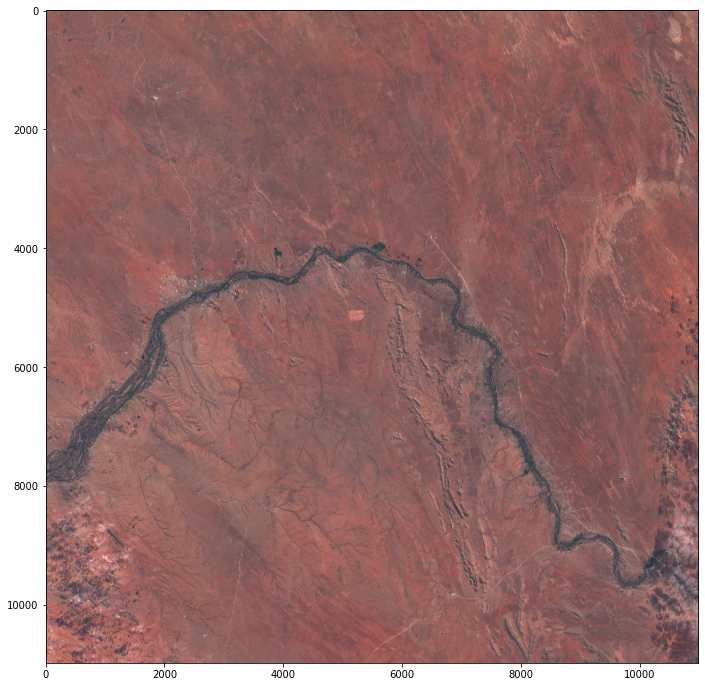

In [33]:
rgb = np.dstack((red, green, blue))
plt.imshow(rgb)

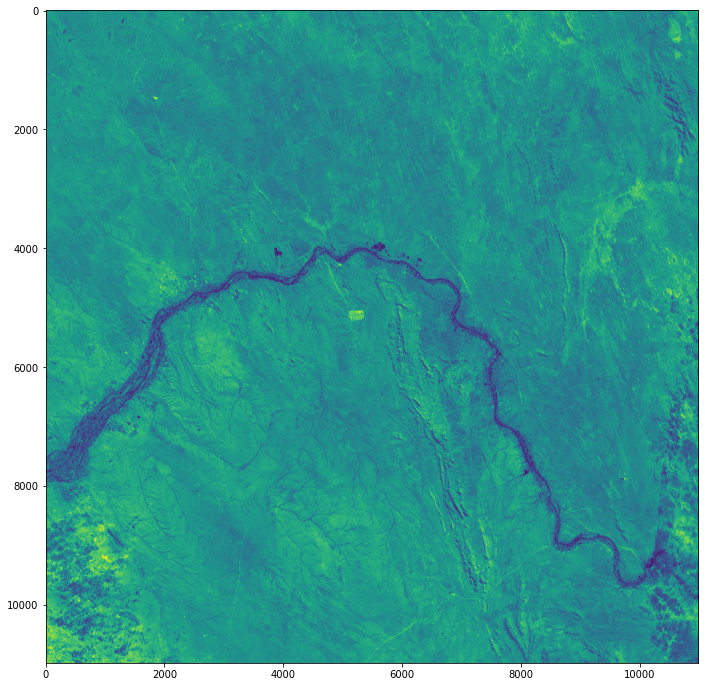

In [34]:
plt.imshow(red)

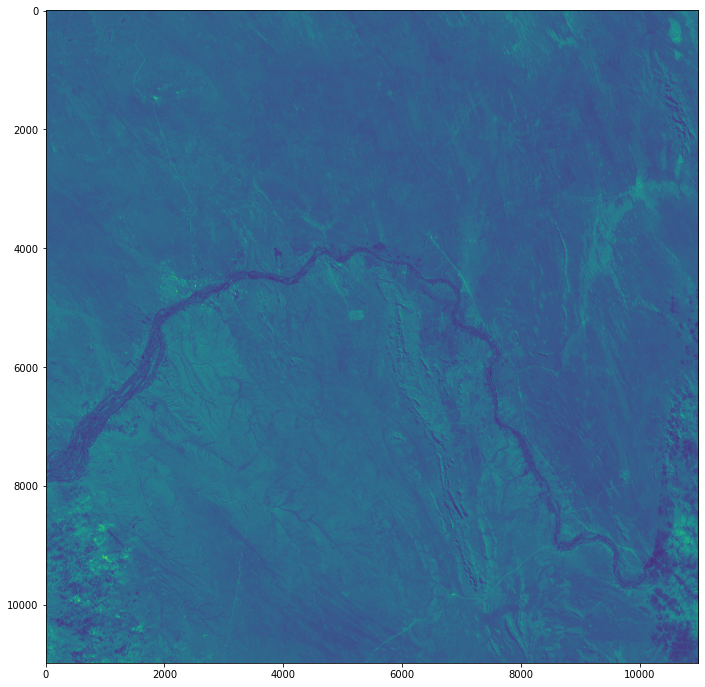

In [35]:
plt.imshow(green)

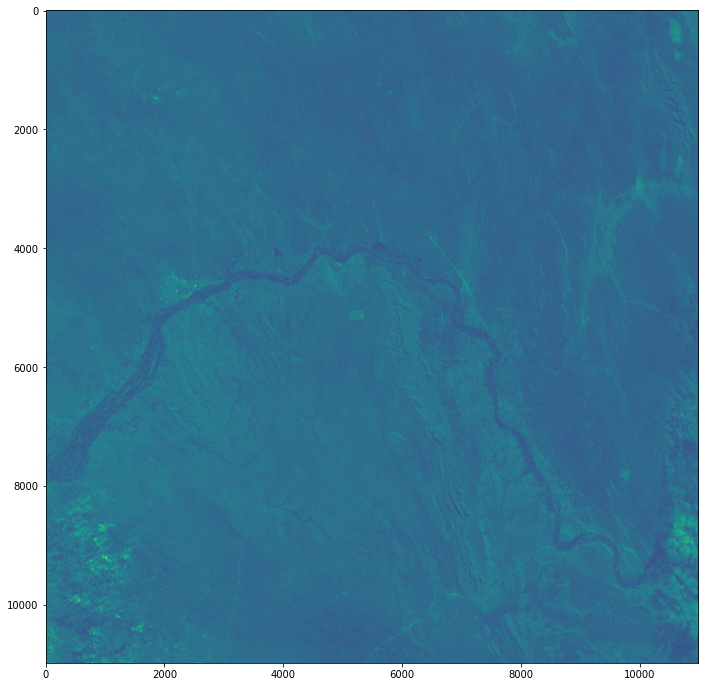

In [36]:
plt.imshow(blue)

In [37]:
src_2 = rasterio.open('/content/gdrive/My Drive/data/2017-01-01/GRANULE/L1C_T34JEP_A007983_20170101T084543/IMG_DATA/T34JEP_20170101T082332_B02.jp2') #blue
src_3 = rasterio.open('/content/gdrive/My Drive/data/2017-01-01/GRANULE/L1C_T34JEP_A007983_20170101T084543/IMG_DATA/T34JEP_20170101T082332_B03.jp2') #green
src_4 = rasterio.open('/content/gdrive/My Drive/data/2017-01-01/GRANULE/L1C_T34JEP_A007983_20170101T084543/IMG_DATA/T34JEP_20170101T082332_B04.jp2') #red
src_8 = rasterio.open('/content/gdrive/My Drive/data/2017-01-01/GRANULE/L1C_T34JEP_A007983_20170101T084543/IMG_DATA/T34JEP_20170101T082332_B08.jp2') #near infrared
arr_2 = src_2.read()
arr_3 = src_3.read()
arr_4 = src_4.read()
arr_8 = src_8.read()

In [38]:
def ndvi(red, nir):
    
    def NDIcalc(nir, red): 
        ndi = (nir - red) / (nir  + red + 1e-5) 
        return ndi

    def norm(arr):
        arr_norm = (255*(arr - np.min(arr))/np.ptp(arr)) 
        return arr_norm

    ndvi = NDIcalc(nir,red)  
    ndvi = ndvi.transpose(1,2,0)
    
    return ndvi

In [39]:
ndvi = ndvi(arr_4, arr_8)
ndvi = (ndvi * 255).astype(np.uint8)

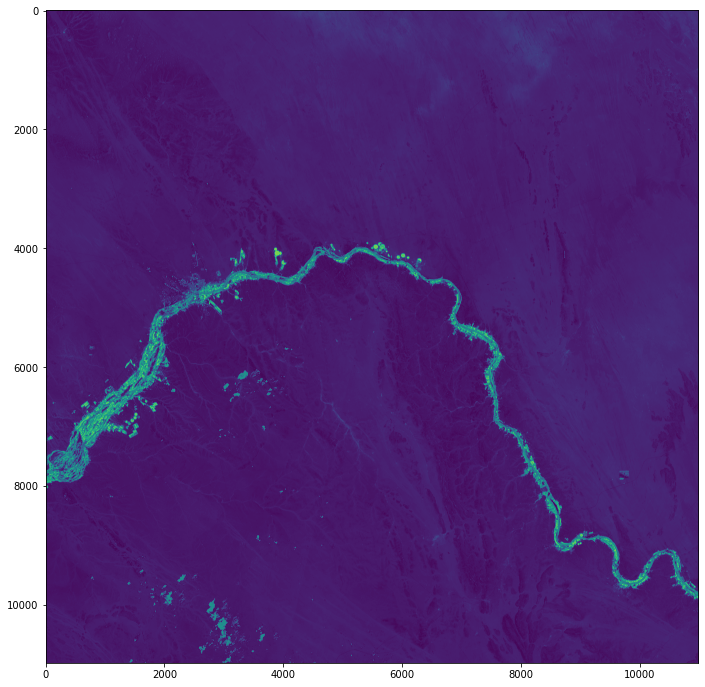

In [40]:
plt.imshow(ndvi[:,:,0])

In [41]:
def savi(red, nir):
    
    def SAVIcalc(red, nir):
        savi = 1.5 * (nir - red) / (nir + red + 0.5)
        return savi
    
    def norm(arr):
        arr_norm = (255*(arr - np.min(arr))/np.ptp(arr)) 
        return arr_norm
    
    savi = SAVIcalc(red,nir) 

    savi = savi.transpose(1,2,0)
    
    return savi

In [42]:
savi = savi(arr_4, arr_8)
savi = (savi * 255).astype(np.uint8)

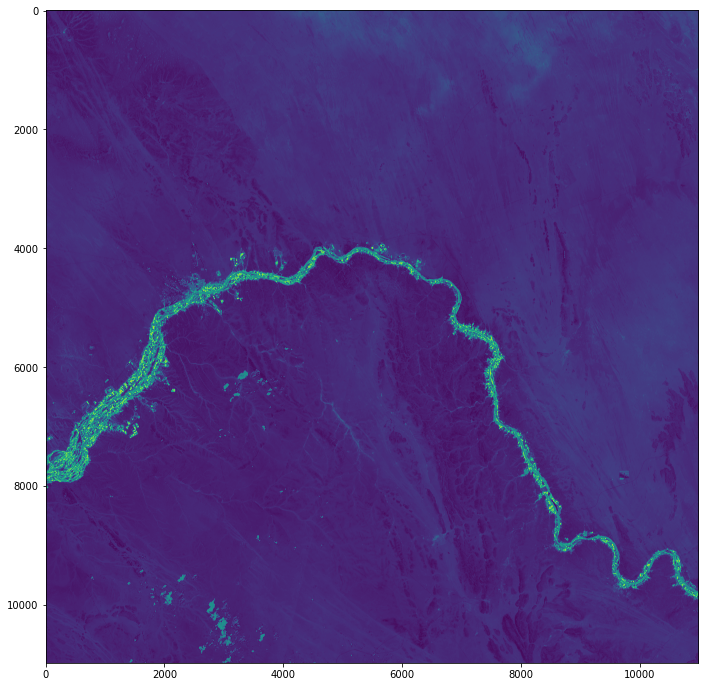

In [43]:
plt.imshow(savi[:,:,0])

In [44]:
def sentinel_read(sentinel_timestamp):
    sentinel_dir = os.path.join(root_dir,sentinel_timestamp)
    bands = glob.glob(sentinel_dir+'/**/*.jp2',recursive=True)

    # Read band metadata and arrays
    # metadata
    src_2 = rasterio.open(fnmatch.filter(bands, '*B02.jp2')[0]) #blue
    src_3 = rasterio.open(fnmatch.filter(bands, '*B03.jp2')[0]) #green
    src_4 = rasterio.open(fnmatch.filter(bands, '*B04.jp2')[0]) #red
    src_8 = rasterio.open(fnmatch.filter(bands, '*B08.jp2')[0]) #near infrared

    # array
    arr_2 = src_2.read()
    arr_3 = src_3.read()
    arr_4 = src_4.read()
    arr_8 = src_8.read()
    return sentinel_dir, arr_2, arr_3, arr_4, arr_8, src_8

In [45]:
def indexnormstack(red, nir):
    
    def NDIcalc(nir, red): 
        ndi = (nir - red) / (nir  + red + 1e-5) 
        return ndi

    
    def SAVIcalc(red, nir):
        savi = 1.5 * (nir - red) / (nir + red + 0.5)
        return savi
    
    def norm(arr):
        arr_norm = (255*(arr - np.min(arr))/np.ptp(arr)) 
        return arr_norm
    
    ndvi = NDIcalc(nir,red) 
    
    savi = SAVIcalc(red,nir) 
    

    ndvi = ndvi.transpose(1,2,0)
    savi = savi.transpose(1,2,0)

    index_stack = np.dstack((ndvi, savi))
    
    return index_stack

In [46]:
index_stack=indexnormstack(arr_4, arr_8)
index_stack = (index_stack* 255).astype(np.uint8)

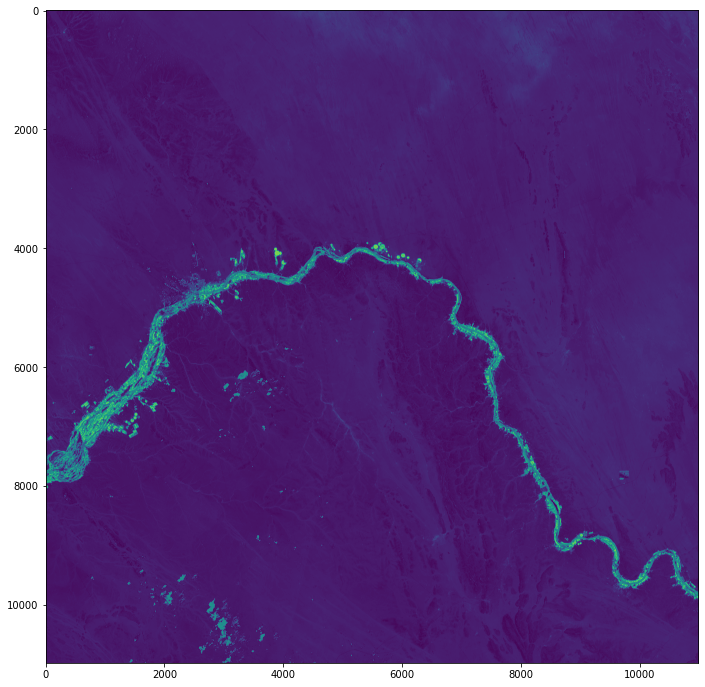

In [47]:
plt.imshow(index_stack[:,:,0])

In [48]:
def label(geo, src_8):
    geo = gpd.read_file(geo)
    # check for and remove invalid geometries
    geo = geo.loc[geo.is_valid] 
    # reproject training data into local coordinate reference system
    geo = geo.to_crs(crs={'init': target_crs})
    #convert the class identifier column to type integer
    geo['Crop_Id_Ne_int']  = geo.Crop_Id_Ne.astype(int)
    # pair the geometries and their integer class values
    shapes = ((geom,value) for geom, value in zip(geo.geometry, geo.Crop_Id_Ne_int)) 
    # get the metadata (height, width, channels, transform, CRS) to use in constructing the labeled image array
    src_8_prf = src_8.profile
    # construct a blank array from the metadata and burn the labels in
    labels = features.rasterize(shapes=shapes, out_shape=(src_8_prf['height'], src_8_prf['width']), fill=0, all_touched=True, transform=src_8_prf['transform'], dtype=src_8_prf['dtype'])
    print("Values in labeled image: ", np.unique(labels))
    return labels

In [49]:
def save_images(sentinel_dir, index_stack, labels, src_8):
    index_stack = (index_stack * 255).astype(np.uint8)
    index_stack_t = index_stack.transpose(2,0,1)
    labels = labels.astype(np.uint8)

    index_stack_out=rasterio.open(sentinel_dir+'/index_stack.tiff', 'w', driver='Gtiff',
                              width=src_8.width, height=src_8.height,
                              count=3,
                              crs=src_8.crs,
                              transform=src_8.transform,
                              dtype='uint8')

    index_stack_out.write(index_stack_t)
    index_stack_out.close()

    labels_out=rasterio.open(sentinel_dir+'/labels.tiff', 'w', driver='Gtiff',
                              width=src_8.width, height=src_8.height,
                              count=1,
                              crs=src_8.crs,
                              transform=src_8.transform,
                              dtype='uint8')

    labels_out.write(labels, 1)
    labels_out.close()
    
    return sentinel_dir+'/index_stack.tiff', sentinel_dir+'/labels.tiff'

In [50]:
def tile(index_stack, labels, sentinel_timestamp):
    tiles_dir = root_dir+'tiled/'
    img_dir = root_dir+'tiled/images_test/'
    label_dir = root_dir+'tiled/labels_test/'
    dirs = [tiles_dir, img_dir, label_dir]
    for d in dirs:
        if not os.path.exists(d):
            os.makedirs(d)
    
    # set tile height and width
    height,width = 224, 224
    
    def get_tiles(ds, width=224, height=224):
        # get number of rows and columns (pixels) in the entire input image
        nols, nrows = ds.meta['width'], ds.meta['height']
        # get the grid from which tiles will be made 
        offsets = product(range(0, nols, width), range(0, nrows, height))
        # get the window of the entire input image
        big_window = windows.Window(col_off=0, row_off=0, width=nols, height=nrows)
        # tile the big window by mini-windows per grid cell
        for col_off, row_off in offsets:
            window = windows.Window(col_off=col_off, row_off=row_off, width=width, height=height).intersection(big_window)
            transform = windows.transform(window, ds.transform)
            yield window, transform
      
    tile_width, tile_height = 224, 224
    
    def crop(inpath, outpath, c):
        # read input image
        image = rasterio.open(inpath)
        # get the metadata 
        meta = image.meta.copy()
        # set the number of channels to 3 or 1, depending on if its the index image or labels image
        meta['count'] = int(c)
        # set the tile output file format to PNG (saves spatial metadata unlike JPG)
        meta['driver']='PNG'
        # tile the input image by the mini-windows
        i = 0
        for window, transform in get_tiles(image):
            meta['transform'] = transform
            meta['width'], meta['height'] = window.width, window.height
            outfile = outpath+"tile_%s_%s.png" % (sentinel_timestamp, str(i))
            with rasterio.open(outfile, 'w', **meta) as outds:
                outds.write(image.read(window=window))
            i = i+1
            
    def process_tiles(index_flag):
        # tile the input images, when index_flag == True, we are tiling the spectral index image, 
        # when False we are tiling the labels image
        if index_flag==True:
            inpath = sentinel_dir+'/index_stack.tiff'
            outpath=img_dir
            crop(inpath, outpath, 3)
        else:
            inpath = sentinel_dir+'/labels.tiff'
            outpath=label_dir
            crop(inpath, outpath, 1)
                
    process_tiles(index_flag=True) # tile index stack
    process_tiles(index_flag=False) # tile labels
    return tiles_dir, img_dir, label_dir

In [51]:
write_out = False
if write_out == True:
  for timestamp in [test_sentinel_timestamp[0]]:
    #timestamp, tiles_dir, img_dir, label_dir = main(timestamp)
    print("timestamp: ", timestamp)

    sentinel_dir, arr_2, arr_3, arr_4, arr_8, src_8 = sentinel_read(timestamp)

    # Calculate indices and combine the indices into one single 3 channel image

    index_stack = indexnormstack(arr_4, arr_8)

    # Rasterize labels
    labels = label(root_dir+'train/train.shp', src_8)

    # reset the path of the Sentinel 2 image directory to your personal drive if you want to write the
    # files out
    
    sentinel_dir = os.path.join(personal_dir,timestamp)
    if not os.path.exists(sentinel_dir):
      os.makedirs(sentinel_dir)
    print(sentinel_dir, src_8)

    # Save index stack and labels to geotiff
    index_stack_file, labels_file = save_images(sentinel_dir, index_stack, labels, src_8)

    # Tile images into 224x224
    tiles_dir, img_dir, label_dir = tile(index_stack, labels, timestamp)
else:
  print("Not writing to file; using data in shared drive.")

Not writing to file; using data in shared drive.


In [52]:
# set the paths to point to the tiles images
tiles_dir = root_dir+'tiled/'

# train
img_dir = root_dir+'tiled/images/'
label_dir = root_dir+'tiled/labels/'

# test
test_img_dir = root_dir+'tiled/images_test/'
test_label_dir = root_dir+'tiled/labels_test/'

----------------------------------------------------------------------------------------------

### Read into tensorflow datasets

In [53]:
# get lists of image and label tile pairs for training and testing

def get_train_test_lists(imdir, lbldir):
  imgs = glob.glob(imdir+"/*.png")
  dset_list = []
  for img in imgs:
    filename_split = os.path.splitext(img) 
    filename_zero, fileext = filename_split 
    basename = os.path.basename(filename_zero) 
    dset_list.append(basename)
    
  x_filenames = []
  y_filenames = []
  for img_id in dset_list:
    x_filenames.append(os.path.join(imdir, "{}.png".format(img_id)))
    y_filenames.append(os.path.join(lbldir, "{}.png".format(img_id)))
    
  print("number of images: ", len(dset_list))
  return dset_list, x_filenames, y_filenames

In [57]:
train_list, x_train_filenames, y_train_filenames = get_train_test_lists(img_dir, label_dir)

number of images:  10000


In [55]:
test_list, x_test_filenames, y_test_filenames = get_train_test_lists(test_img_dir, test_label_dir)

number of images:  2500


In [58]:
skip = False

if not skip:
  background_list_train = []
  for i in train_list: 
      # read in each labeled images
      img = np.array(Image.open(label_dir+"{}.png".format(i))) 
      # check if no values in image are greater than zero (background value)
      if img.max()==0:
          background_list_train.append(i)
          
  print("number of background training images: ", len(background_list_train))

  background_list_test = []
  for i in test_list: 
      img = np.array(Image.open(test_label_dir+"{}.png".format(i))) 
      if img.max()==0:
          background_list_test.append(i)
          
  print("number of background test images: ", len(background_list_test))

  with open(os.path.join(personal_dir,'background_list_train.txt'), 'w') as f:
    for item in background_list_train:
        f.write("%s\n" % item)
  with open(os.path.join(personal_dir,'background_list_test.txt'), 'w') as f:
    for item in background_list_test:
        f.write("%s\n" % item)

else:
  background_list_train = [line.strip() for line in open("background_list_train.txt", 'r')]
  print("number of background training images: ", len(background_list_train))
  
  background_list_test = [line.strip() for line in open("background_list_test.txt", 'r')]
  print("number of background test images: ", len(background_list_test))

number of background training images:  9620
number of background test images:  2405


In [59]:
background_removal = len(background_list_train) * 0.9
train_list_clean = [y for y in train_list if y not in background_list_train[0:int(background_removal)]]

x_train_filenames = []
y_train_filenames = []
for img_id in train_list_clean: 
  x_train_filenames.append(os.path.join(img_dir, "{}.png".format(img_id)))
  y_train_filenames.append(os.path.join(label_dir, "{}.png".format(img_id)))
    
print(len(train_list_clean))

1342


In [60]:
x_train_filenames, x_val_filenames, y_train_filenames, y_val_filenames = train_test_split(x_train_filenames, y_train_filenames, test_size=0.1, random_state=42)

num_train_examples = len(x_train_filenames)
num_val_examples = len(x_val_filenames)
num_test_examples = len(x_test_filenames)

print("Number of training examples: {}".format(num_train_examples))
print("Number of validation examples: {}".format(num_val_examples))
print("Number of test examples: {}".format(num_test_examples))

Number of training examples: 1207
Number of validation examples: 135
Number of test examples: 2500


### Visualize the data

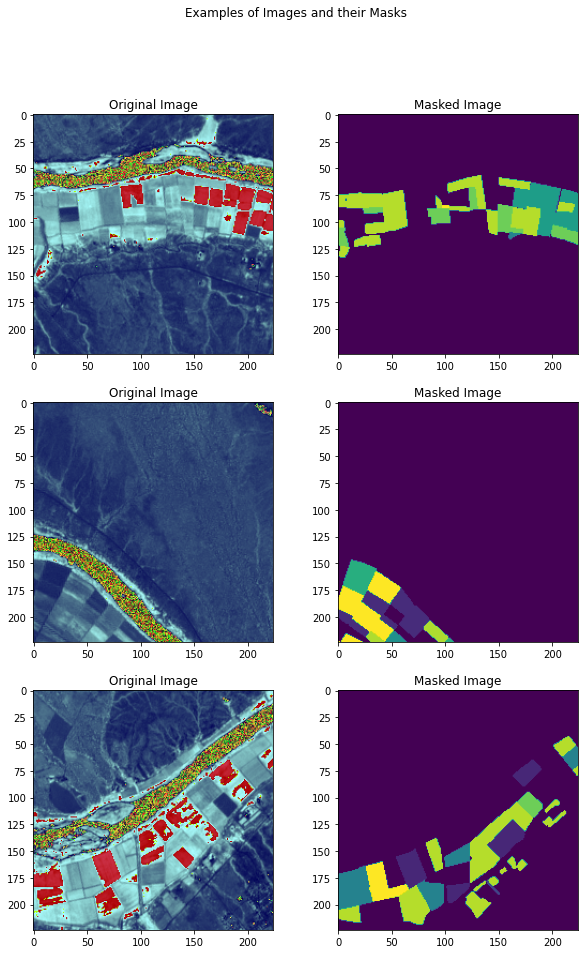

In [61]:
display_num = 3

# select only for tiles with foreground labels present
foreground_list_x = []
foreground_list_y = []
for x,y in zip(x_train_filenames, y_train_filenames): 
    img = np.array(Image.open(y)) 
    if img.max()>0:
        foreground_list_x.append(x)
        foreground_list_y.append(y)

num_foreground_examples = len(foreground_list_y)

# randomlize the choice of image and label pairs
r_choices = np.random.choice(num_foreground_examples, display_num)

plt.figure(figsize=(10, 15))
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]
  x_pathname = foreground_list_x[img_num]
  y_pathname = foreground_list_y[img_num]
  
  plt.subplot(display_num, 2, i + 1)
  plt.imshow(mpimg.imread(x_pathname))
  plt.title("Original Image")
  
  example_labels = Image.open(y_pathname)
  label_vals = np.unique(np.array(example_labels))
  
  plt.subplot(display_num, 2, i + 2)
  plt.imshow(example_labels)
  plt.title("Masked Image")  
  
plt.suptitle("Examples of Images and their Masks")
plt.show()

In [62]:
# set input image shape
img_shape = (224, 224, 3)
# set batch size for model
batch_size = 2

In [63]:
# Function for reading the tiles into TensorFlow tensors 
# See TensorFlow documentation for explanation of tensor: https://www.tensorflow.org/guide/tensor
def _process_pathnames(fname, label_path):
  # We map this function onto each pathname pair  
  img_str = tf.io.read_file(fname)
  img = tf.image.decode_png(img_str, channels=3)

  label_img_str = tf.io.read_file(label_path)

  # These are png images so they return as (num_frames, h, w, c)
  label_img = tf.image.decode_png(label_img_str, channels=1)
  # The label image should have any values between 0 and 9, indicating pixel wise
  # cropt type class or background (0). We take the first channel only. 
  label_img = label_img[:, :, 0]
  label_img = tf.expand_dims(label_img, axis=-1)
  return img, label_img

In [64]:
# Function to augment the data with horizontal flip
def flip_img_h(horizontal_flip, tr_img, label_img):
  if horizontal_flip:
    flip_prob = tf.random.uniform([], 0.0, 1.0)
    tr_img, label_img = tf.cond(tf.less(flip_prob, 0.5),
                                lambda: (tf.image.flip_left_right(tr_img), tf.image.flip_left_right(label_img)),
                                lambda: (tr_img, label_img))
  return tr_img, label_img

In [65]:
# Function to augment the data with vertical flip
def flip_img_v(vertical_flip, tr_img, label_img):
  if vertical_flip:
    flip_prob = tf.random.uniform([], 0.0, 1.0)
    tr_img, label_img = tf.cond(tf.less(flip_prob, 0.5),
                                lambda: (tf.image.flip_up_down(tr_img), tf.image.flip_up_down(label_img)),
                                lambda: (tr_img, label_img))
  return tr_img, label_img

In [66]:
# Function to augment the images and labels
def _augment(img,
             label_img,
             resize=None,  # Resize the image to some size e.g. [256, 256]
             scale=1,  # Scale image e.g. 1 / 255.
             horizontal_flip=False,
             vertical_flip=False): 
  if resize is not None:
    # Resize both images
    label_img = tf.image.resize(label_img, resize)
    img = tf.image.resize(img, resize)
  
  img, label_img = flip_img_h(horizontal_flip, img, label_img)
  img, label_img = flip_img_v(vertical_flip, img, label_img)
  img = tf.cast(img, tf.float32) * scale  #tf.to_float(img) * scale 
  #label_img = tf.cast(label_img, tf.float32) * scale
  #print("tensor: ", tf.unique(tf.keras.backend.print_tensor(label_img)))
  return img, label_img

In [67]:
# Main function to tie all of the above four dataset processing functions together 
def get_baseline_dataset(filenames, 
                         labels,
                         preproc_fn=functools.partial(_augment),
                         threads=5, 
                         batch_size=batch_size,
                         shuffle=True):           
  num_x = len(filenames)
  # Create a dataset from the filenames and labels
  dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
  # Map our preprocessing function to every element in our dataset, taking
  # advantage of multithreading
  dataset = dataset.map(_process_pathnames, num_parallel_calls=threads)
  if preproc_fn.keywords is not None and 'resize' not in preproc_fn.keywords:
    assert batch_size == 1, "Batching images must be of the same size"

  dataset = dataset.map(preproc_fn, num_parallel_calls=threads)
  
  if shuffle:
    dataset = dataset.shuffle(num_x)
  
  
  # It's necessary to repeat our data for all epochs 
  dataset = dataset.repeat().batch(batch_size)
  return dataset

In [68]:
# dataset configuration for training
tr_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    'scale': 1 / 255.,
    'horizontal_flip': True,
    'vertical_flip': True,
}
tr_preprocessing_fn = functools.partial(_augment, **tr_cfg)

In [69]:
# dataset configuration for validation
val_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    'scale': 1 / 255.,
}
val_preprocessing_fn = functools.partial(_augment, **val_cfg)

In [70]:
# dataset configuration for testing
test_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    'scale': 1 / 255.,
}
test_preprocessing_fn = functools.partial(_augment, **test_cfg)

In [71]:
# create the TensorFlow datasets
train_ds = get_baseline_dataset(x_train_filenames,
                                y_train_filenames,
                                preproc_fn=tr_preprocessing_fn,
                                batch_size=batch_size)
val_ds = get_baseline_dataset(x_val_filenames,
                              y_val_filenames, 
                              preproc_fn=val_preprocessing_fn,
                              batch_size=batch_size)
test_ds = get_baseline_dataset(x_test_filenames,
                              y_test_filenames, 
                              preproc_fn=test_preprocessing_fn,
                              batch_size=batch_size)

In [72]:
# Now we will display some samples from the datasets
display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=tr_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]

In [73]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

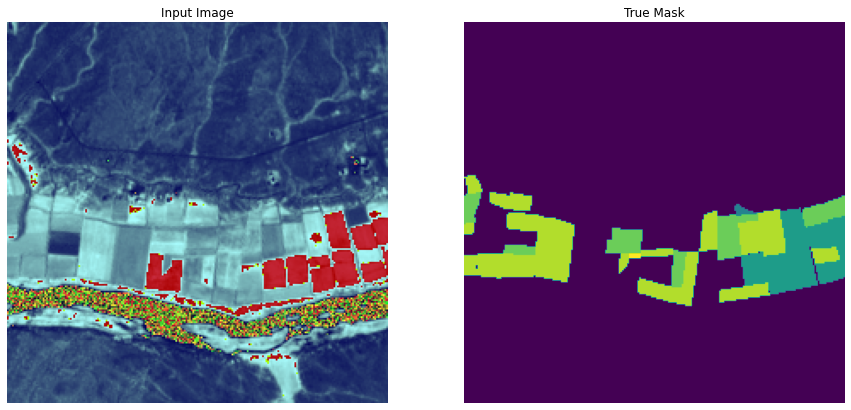

In [74]:
# display sample train image
display([sample_image, sample_mask])

In [75]:
OUTPUT_CHANNELS = 10

## DeepLabv3

### Define the model

In [76]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
def convolution_block(block_input,num_filters=512,kernel_size=3,dilation_rate=3,padding="same",use_bias=False):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)


def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

In [ ]:
#!pip install keras-tuner
def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    return keras.Model(inputs=model_input, outputs=model_output)

### Train the model

In [ ]:
model = DeeplabV3Plus(image_size=224, num_classes=10)
model.summary()

94781440/94765736 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                             

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.01),
              loss=SparseCategoricalFocalLoss(gamma=2, from_logits=True),
              metrics=['accuracy'])

In [ ]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [ ]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    mp = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    mpe = tf.keras.backend.eval(mp)
    display([sample_image, sample_mask, mpe])

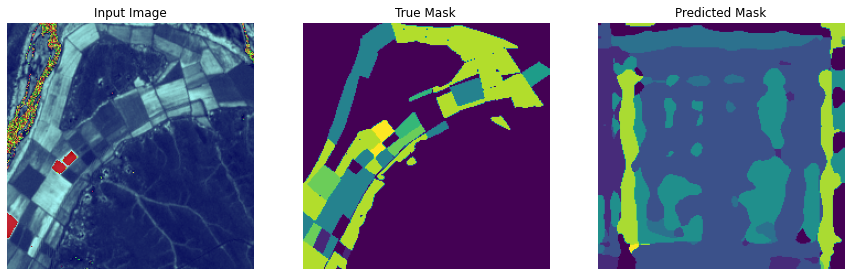

In [ ]:
show_predictions()

In [106]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

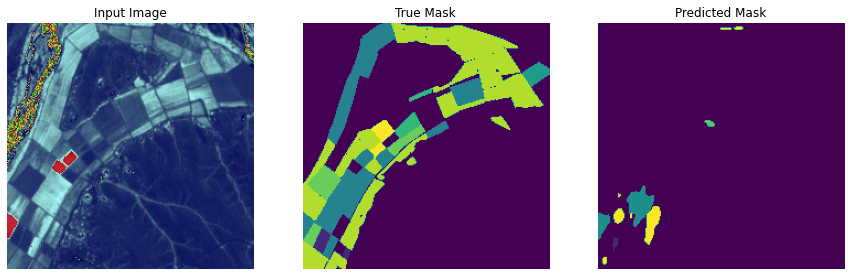


Sample Prediction after epoch 100

604/604 [==============================] - 64s 106ms/step - loss: 0.0289 - accuracy: 0.9787 - val_loss: 0.0976 - val_accuracy: 0.9657


In [ ]:
EPOCHS=100
model_history = model.fit(train_ds, 
                   steps_per_epoch=int(np.ceil(num_train_examples / float(batch_size))),
                   epochs=EPOCHS,
                   validation_data=val_ds,
                   validation_steps=int(np.ceil(num_val_examples / float(batch_size))),
                   callbacks=[DisplayCallback()]) 

#### Save model to file



In [ ]:
save_model_path = os.path.join(personal_dir,'model_out/')
if (not os.path.isdir(save_model_path)):
  os.mkdir(save_model_path)
model.save(save_model_path)

### Make predictions



In [ ]:
def get_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      return pred_mask
  else:
    pred_mask = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    pred_mask = tf.keras.backend.eval(pred_mask)
    return pred_mask

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2039.png']
[0 4 5 7 9]


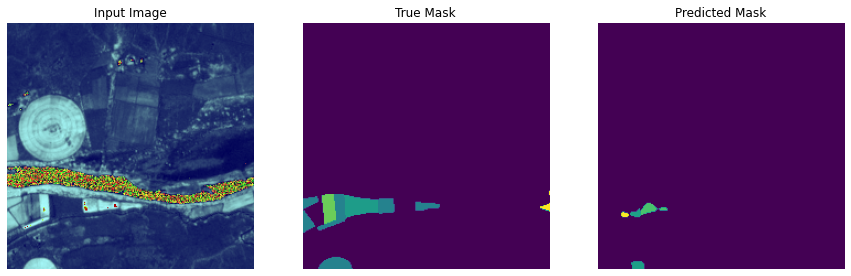

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2040.png']
[0 4]


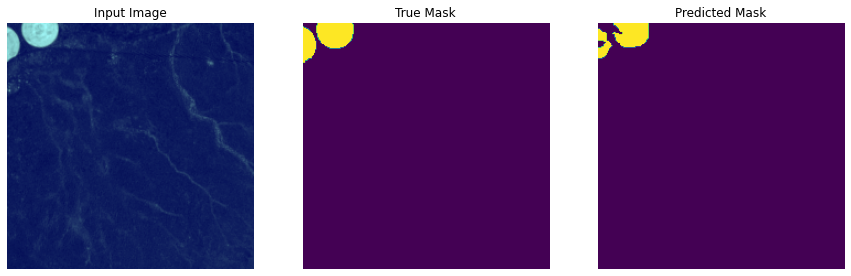

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2089.png']
[0 1 4 6 7 8 9]


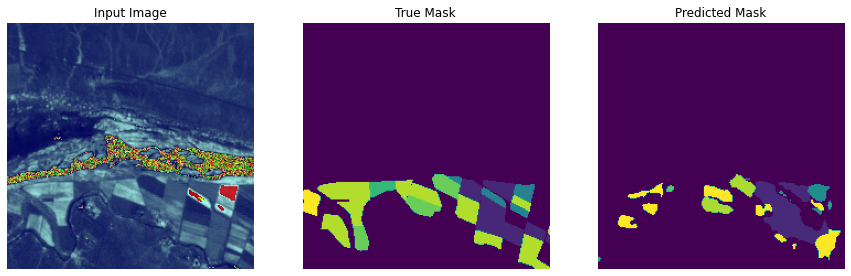

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2090.png']
[0 8]


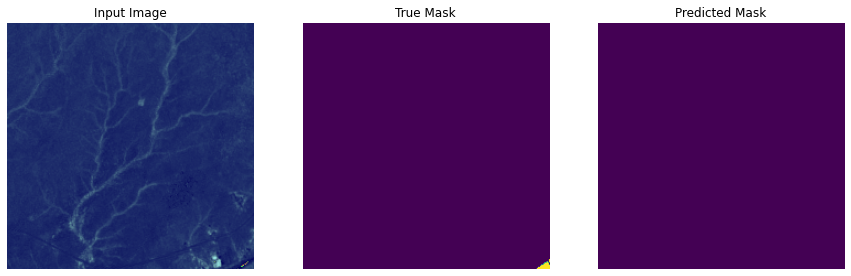

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2139.png']
[0 1 3 4 5 7 8]


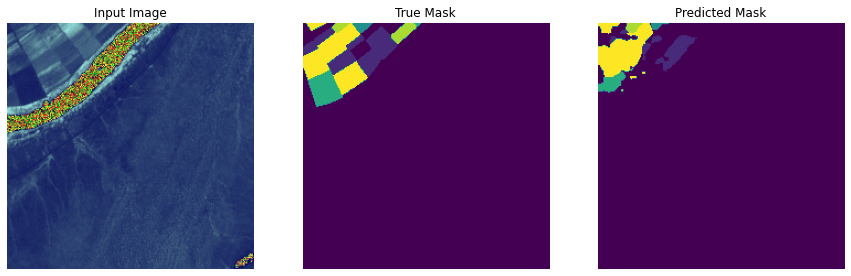

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2140.png']
[0 1 3 4 5 6 7 8]


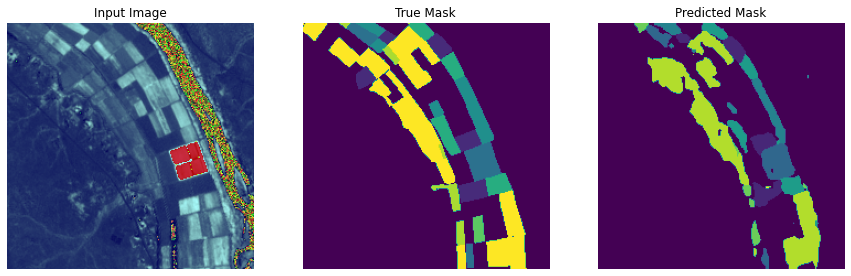

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2141.png']
[0 2 3 4 5 7 8 9]


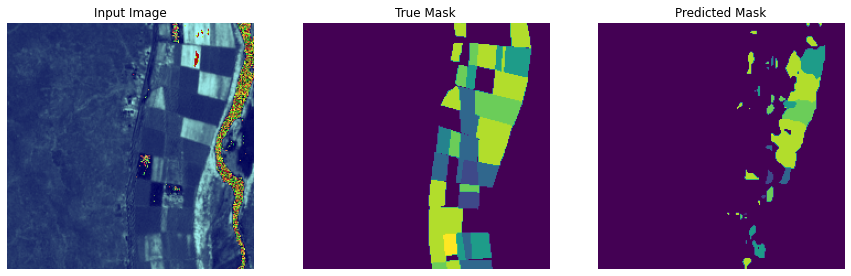

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2142.png']
[0 1 3 4 5 7 8]


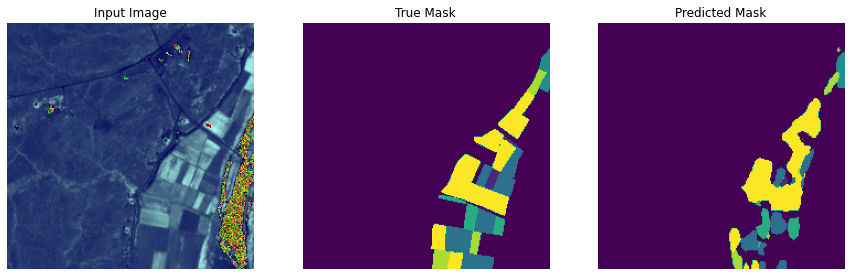

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2192.png']
[0 3 4 6 7 8 9]


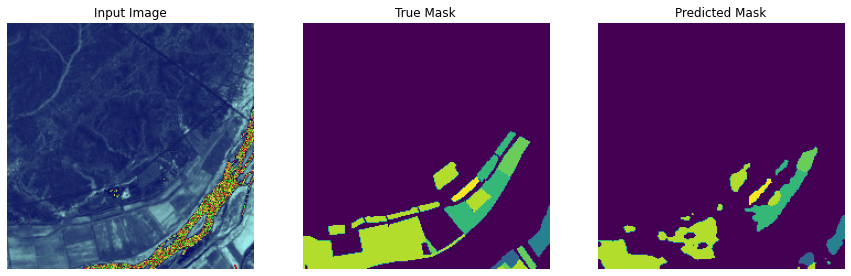

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2193.png']
[0 1 3 4 7 8]


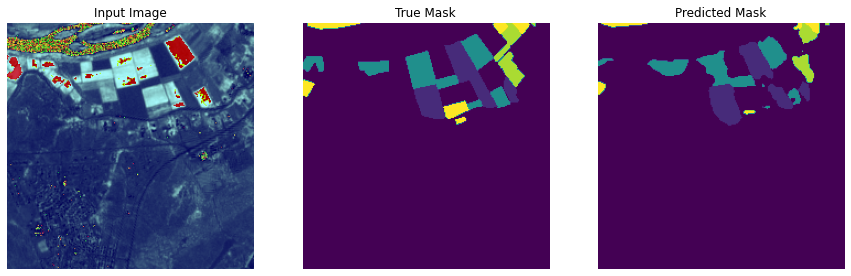

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2241.png']
[0 5 7 8]


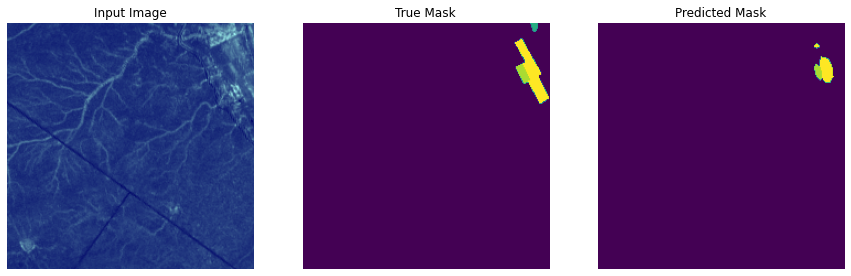

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2242.png']
[0 3 4 5 6 7 8]


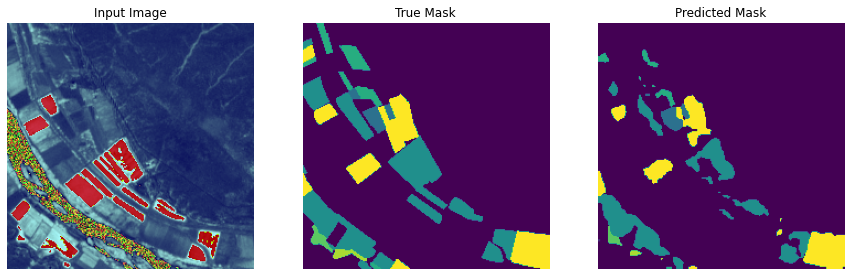

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2243.png']
[0 1 3 4 5 7 8 9]


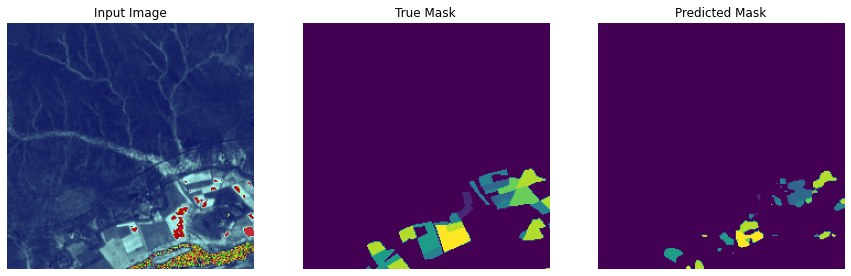

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2290.png']
[0 3 4 5 8]


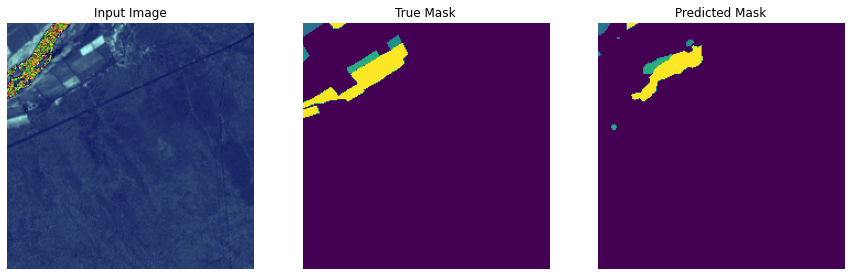

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2291.png']
[0 3 4 5 6 7 8]


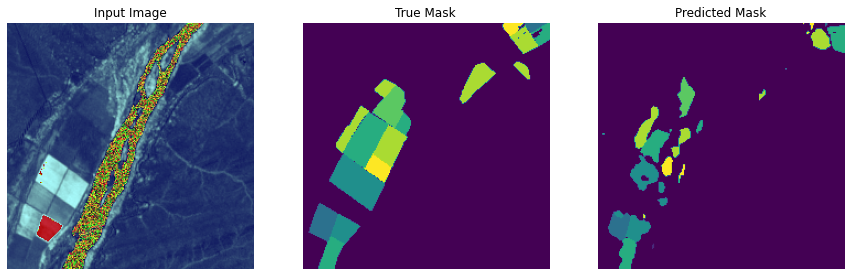

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2292.png']
[0 3 4 5 8]


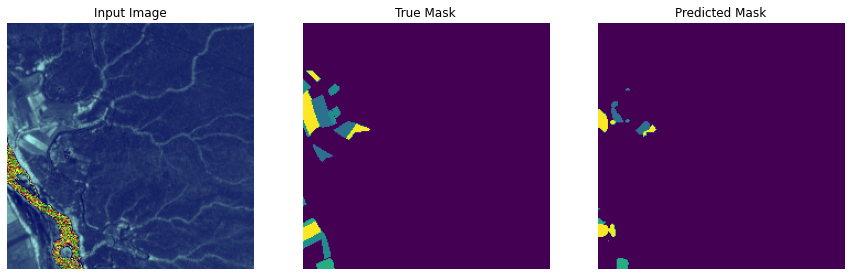

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2342.png']
[0 8]


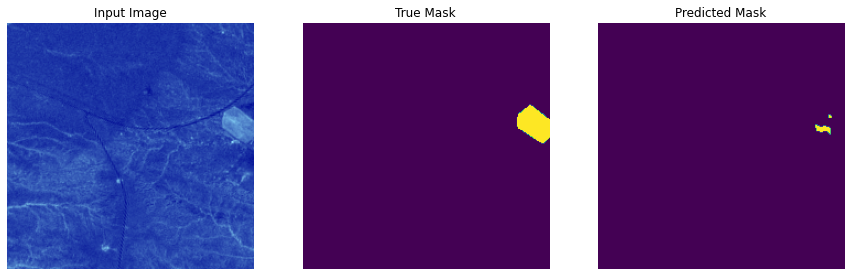

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2341.png']
[0 1 4 5 7]


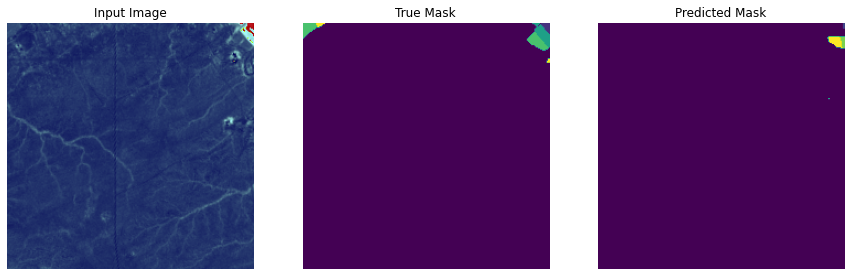

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2340.png']
[0 1 3 4 5 7 8]


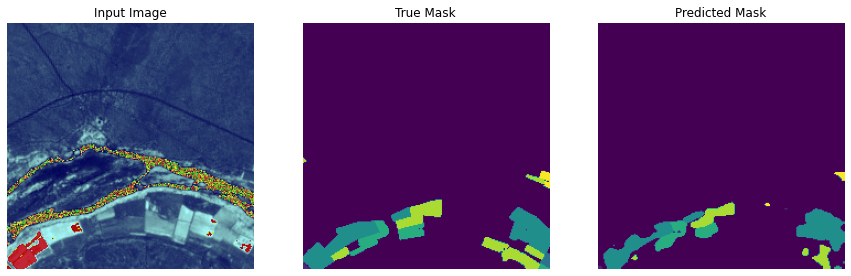

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2390.png']
[0 1 3 5 7 8]


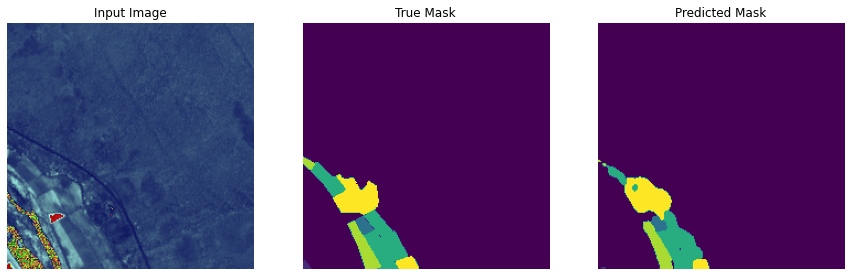

In [ ]:
tiled_prediction_dir = os.path.join(personal_dir,'predictions_test/')
if not os.path.exists(tiled_prediction_dir):
    os.makedirs(tiled_prediction_dir)
    
pred_masks = []
true_masks = []

for i in range(0, 20):
    img_num = i

    temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                                   foreground_list_y[img_num:img_num+1],
                                   preproc_fn=tr_preprocessing_fn,
                                   batch_size=1,
                                   shuffle=False)

    # Let's examine some of these augmented images

    iterator = iter(temp_ds)
    next_element = iterator.get_next()

    batch_of_imgs, label = next_element

    # Running next element in our graph will produce a batch of images

    sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]
    sample_mask_int = tf.dtypes.cast(sample_mask, tf.int32)
    true_masks.append(sample_mask_int)
    print(foreground_list_y[img_num:img_num+1])
    print(np.unique(sample_mask_int))

    # run and plot predicitions

    show_predictions()
    pred_mask = get_predictions()
    pred_masks.append(pred_mask)
    
    # save prediction images to file

    filename_split = os.path.splitext(foreground_list_x[img_num]) 
    filename_zero, fileext = filename_split 
    basename = os.path.basename(filename_zero) 
    tf.keras.preprocessing.image.save_img(tiled_prediction_dir+'/'+basename+".png",pred_mask)    

### Evaluate Model


In [ ]:
# flatten our tensors and use scikit-learn to create a confusion matrix
flat_preds = tf.reshape(pred_masks, [-1]) 
flat_truth = tf.reshape(true_masks, [-1]) 
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(OUTPUT_CHANNELS)))

In [ ]:
# check values in predicted masks vs truth masks
check_preds = tf.keras.backend.eval(flat_preds)
check_truths = tf.keras.backend.eval(flat_truth)
print(np.unique(check_preds), np.unique(check_truths))

[0 1 2 3 4 5 6 7 8 9] [0 1 2 3 4 5 6 7 8 9]


(9.5, -0.5)

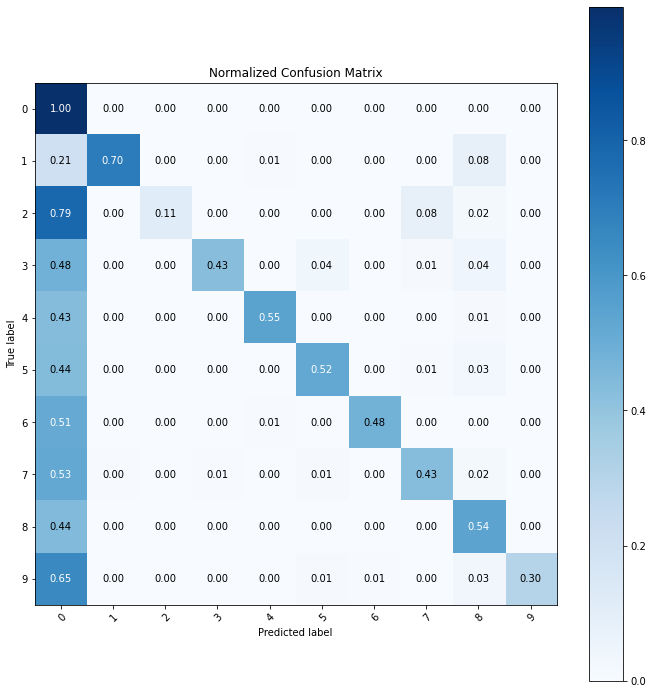

In [ ]:
classes = [0,1,2,3,4,5,6,7,8,9]

%matplotlib inline
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
# We want to show all ticks...
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       # ... and label them with the respective list entries
       xticklabels=list(range(OUTPUT_CHANNELS)), yticklabels=list(range(OUTPUT_CHANNELS)),
       title='Normalized Confusion Matrix',
       ylabel='True label',
       xlabel='Predicted label')

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = '.2f' #'d' # if normalize else 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
fig.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)
ax.set_ylim(len(classes)-0.5, -0.5)

In [ ]:
# compute f1 score
f1_score(flat_truth, flat_preds, average='macro')

0.6209842130703881

In [ ]:
from sklearn.metrics import *
cohen_kappa_score (flat_truth, flat_preds)

0.6678522935520308

In [ ]:
m = tf.keras.metrics.MeanIoU(num_classes=10)
m.update_state(flat_truth, flat_preds)
m.result().numpy()

0.4787611

In [ ]:
a = tf.keras.metrics.Accuracy()
a.update_state(flat_truth, flat_preds)
a.result().numpy()

0.9537259

## U-Net

### Define the model

In [14]:
from keras import *

In [15]:
def double_conv_block(x, n_filters):
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   return x

In [16]:
def downsample_block(x, n_filters):
   f = double_conv_block(x, n_filters)
   p = layers.MaxPool2D(2)(f)
   p = layers.Dropout(0.3)(p)
   return f, p

In [17]:
def upsample_block(x, conv_features, n_filters):
   # upsample
   x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
   # concatenate
   x = layers.concatenate([x, conv_features])
   # dropout
   x = layers.Dropout(0.3)(x)
   # Conv2D twice with ReLU activation
   x = double_conv_block(x, n_filters)
   return x

In [18]:
def build_unet():
# inputs
   inputs = layers.Input(shape=(224,224,3))
   # encoder: contracting path - downsample
   # 1 - downsample
   f1, p1 = downsample_block(inputs, 64)
   # 2 - downsample
   f2, p2 = downsample_block(p1, 128)
   # 3 - downsample
   f3, p3 = downsample_block(p2, 256)
   # 4 - downsample
   f4, p4 = downsample_block(p3, 512)
   # 5 - bottleneck
   bottleneck = double_conv_block(p4, 1024)
   # decoder: expanding path - upsample
   # 6 - upsample
   u6 = upsample_block(bottleneck, f4, 512)
   # 7 - upsample
   u7 = upsample_block(u6, f3, 256)
   # 8 - upsample
   u8 = upsample_block(u7, f2, 128)
   # 9 - upsample
   u9 = upsample_block(u8, f1, 64)
   # outputs
   outputs = layers.Conv2D(10, 1, padding="same", activation = "softmax")(u9)
   # unet model with Keras Functional API
   unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
   return unet_model

In [19]:
model=build_unet()

In [20]:
model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_24 (Conv2D)             (None, 224, 224, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_25 (Conv2D)             (None, 224, 224, 64  36928       ['conv2d_24[0][0]']              
                                )                                                             

### Train the model

In [96]:
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001),
              loss=SparseCategoricalFocalLoss(gamma=2, from_logits=True),
              metrics=['accuracy'])

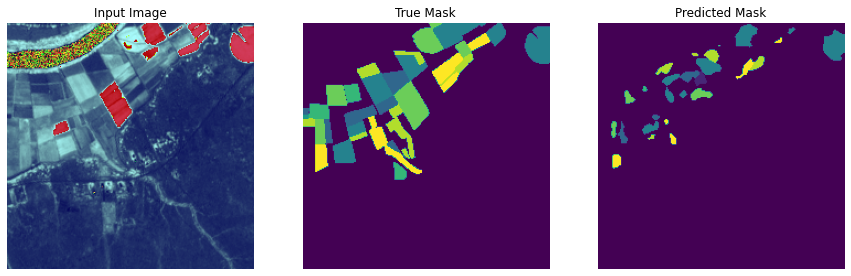


Sample Prediction after epoch 150

604/604 [==============================] - 63s 104ms/step - loss: 0.0050 - accuracy: 0.9946 - val_loss: 0.1171 - val_accuracy: 0.9656


In [107]:
EPOCHS=150
model_history = model.fit(train_ds, 
                   steps_per_epoch=int(np.ceil(num_train_examples / float(batch_size))),
                   epochs=EPOCHS,
                   validation_data=val_ds,
                   validation_steps=int(np.ceil(num_val_examples / float(batch_size))),
                   callbacks=[DisplayCallback()]) 

### Make Predictions

In [108]:
def get_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      return pred_mask
  else:
    pred_mask = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    pred_mask = tf.keras.backend.eval(pred_mask)
    return pred_mask

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-06-20_2089.png']
[0 1 4 6 7 8 9]


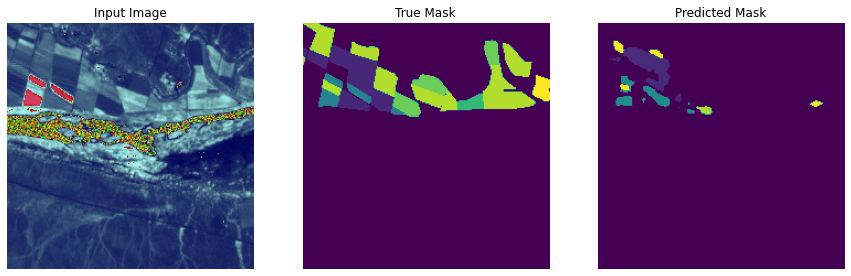

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1269.png']
[0 1 3 4 5 8]


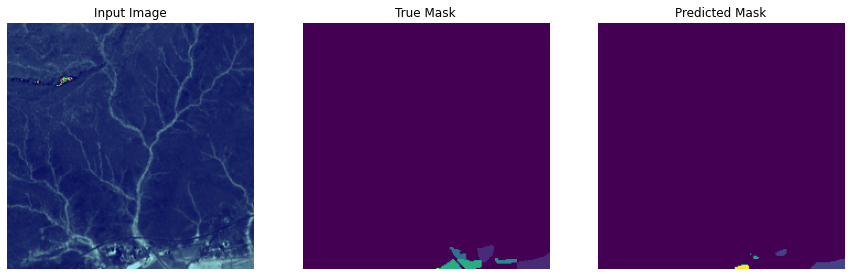

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-06-20_1319.png']
[0 1 4 5 7 8]


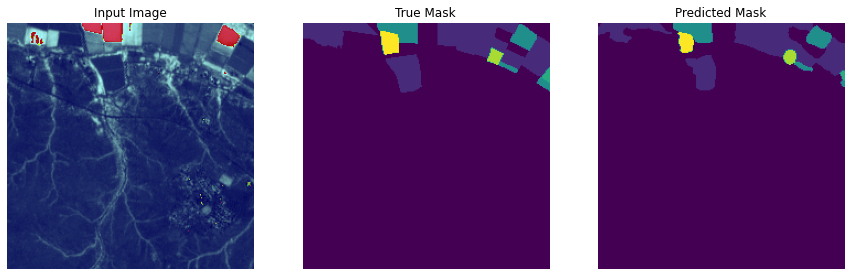

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1886.png']
[0 3 4 5 6 7 8 9]


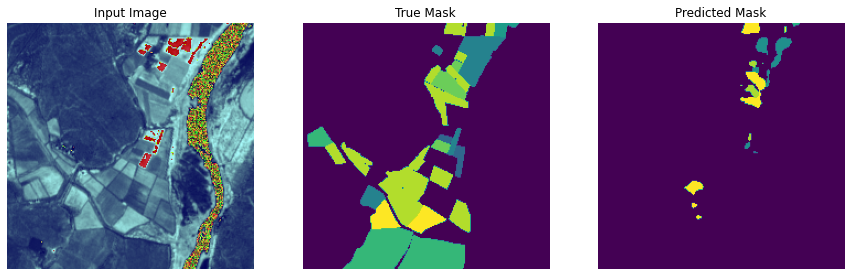

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-03-22_1833.png']
[0 4 5 8 9]


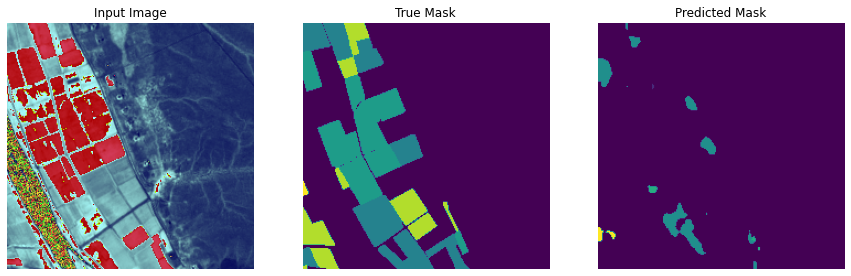

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-08-04_1319.png']
[0 1 4 5 7 8]


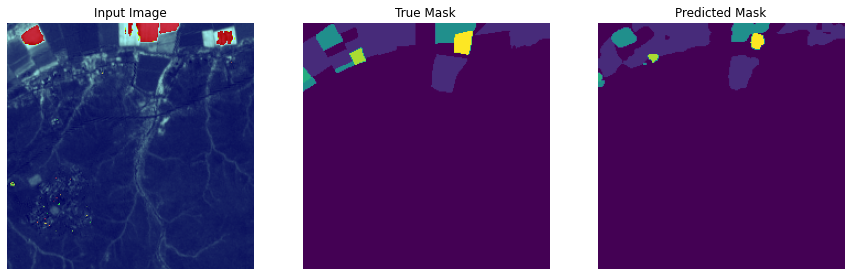

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-03-22_769.png']
[0 8]


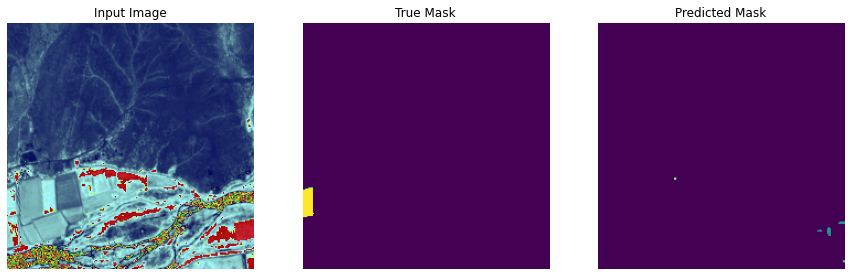

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-08-04_1520.png']
[0 4 5 7 8]


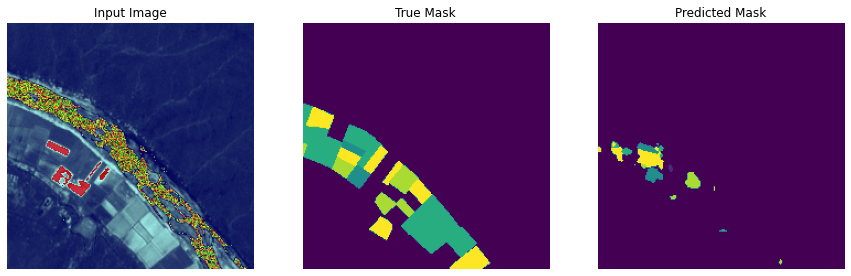

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_2494.png']
[0 1 2 3 4 5 6 7]


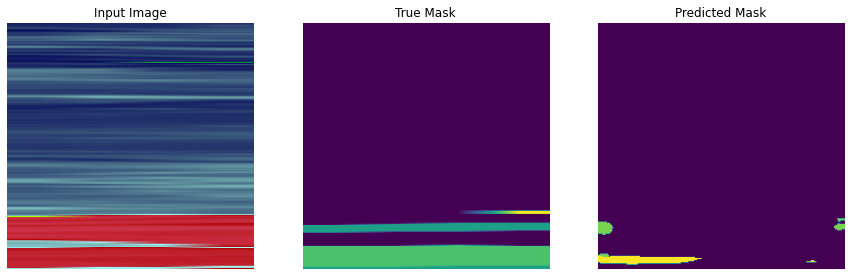

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_2290.png']
[0 3 4 5 8]


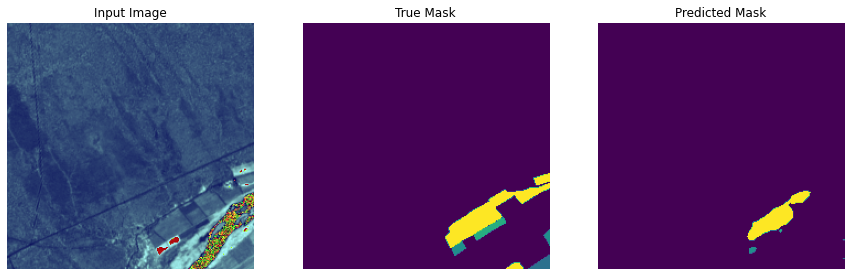

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-08-04_1573.png']
[0 4 5 6 7 8 9]


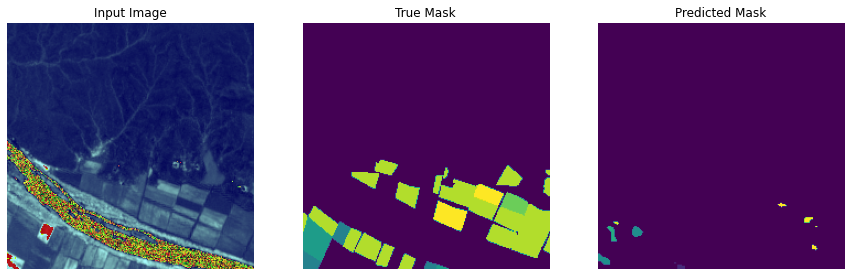

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1989.png']
[0 4 5 7]


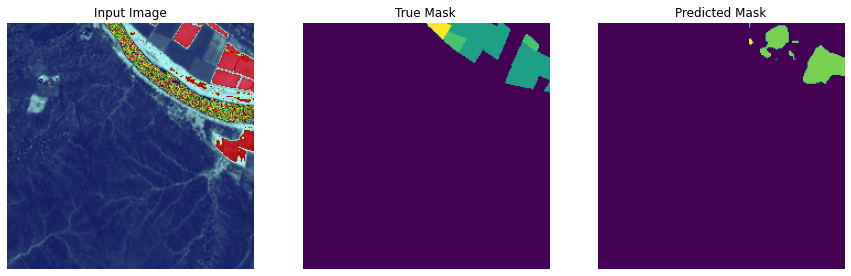

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-06-20_1784.png']
[0 4 8]


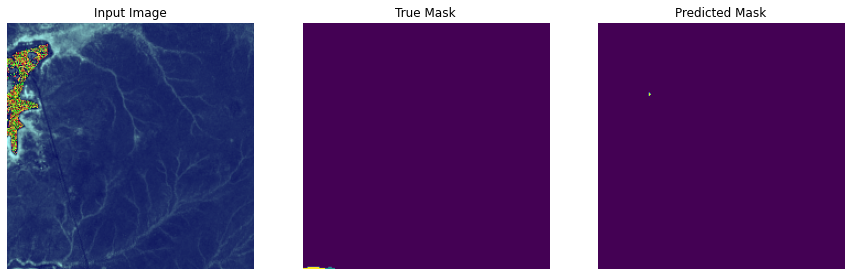

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-06-20_1522.png']
[0 1 4 5 6 7 8]


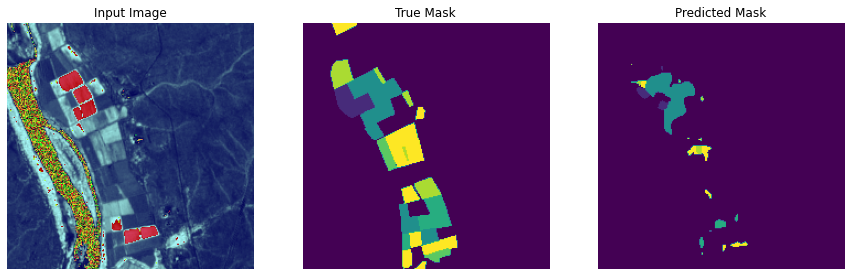

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-08-04_1318.png']
[0 1 4 8]


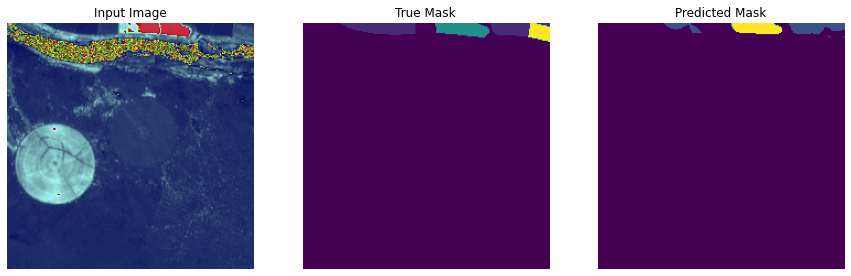

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1017.png']
[0 4]


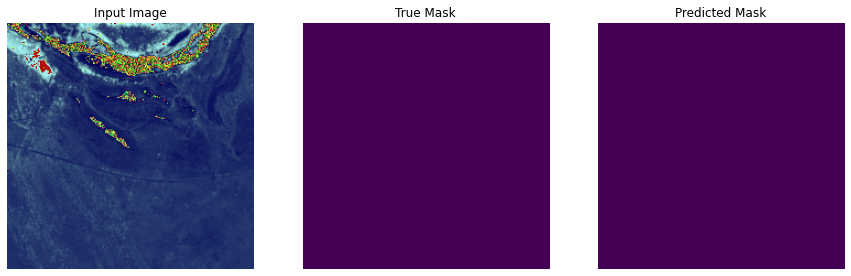

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-03-22_1521.png']
[0 5 8]


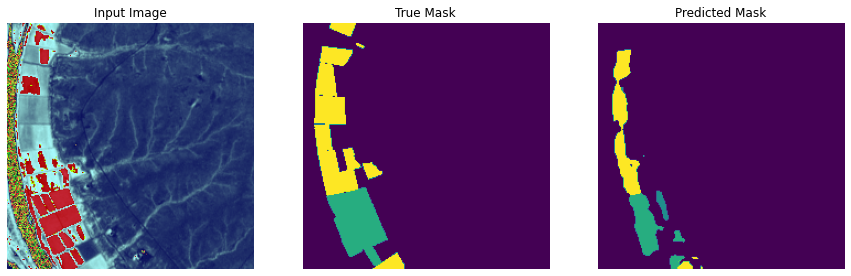

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_2242.png']
[0 3 4 5 6 7 8]


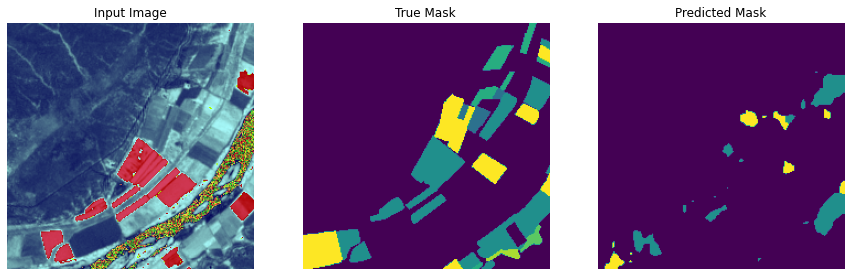

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-03-22_1523.png']
[0 3 4 5 6 7 8]


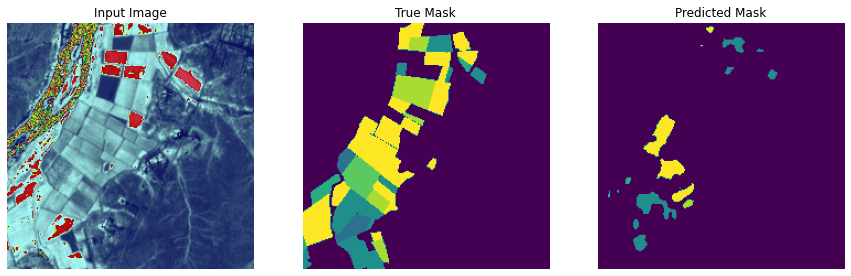

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1990.png']
[0 3 4 5 6 7 8 9]


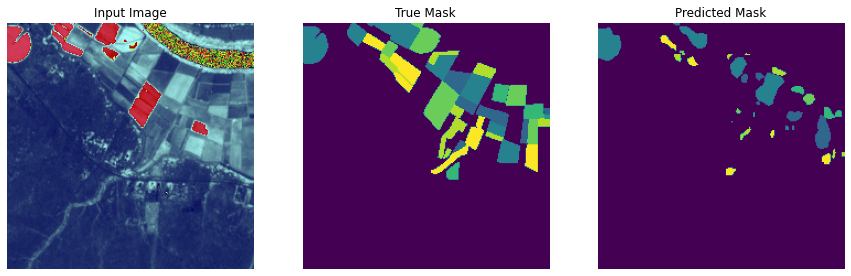

In [110]:
tiled_prediction_dir = os.path.join(personal_dir,'predictions_test/')
if not os.path.exists(tiled_prediction_dir):
    os.makedirs(tiled_prediction_dir)
    
pred_masks = []
true_masks = []

for i in range(0, 20):
    img_num = i

    temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                                   foreground_list_y[img_num:img_num+1],
                                   preproc_fn=tr_preprocessing_fn,
                                   batch_size=1,
                                   shuffle=False)

    # Let's examine some of these augmented images

    iterator = iter(temp_ds)
    next_element = iterator.get_next()

    batch_of_imgs, label = next_element

    # Running next element in our graph will produce a batch of images

    sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]
    sample_mask_int = tf.dtypes.cast(sample_mask, tf.int32)
    true_masks.append(sample_mask_int)
    print(foreground_list_y[img_num:img_num+1])
    print(np.unique(sample_mask_int))

    # run and plot predicitions

    show_predictions()
    pred_mask = get_predictions()
    pred_masks.append(pred_mask)
    
    # save prediction images to file

    filename_split = os.path.splitext(foreground_list_x[img_num]) 
    filename_zero, fileext = filename_split 
    basename = os.path.basename(filename_zero) 
    tf.keras.preprocessing.image.save_img(tiled_prediction_dir+'/'+basename+".png",pred_mask)    

### Evaluate

In [ ]:
# flatten our tensors and use scikit-learn to create a confusion matrix
flat_preds = tf.reshape(pred_masks, [-1]) 
flat_truth = tf.reshape(true_masks, [-1]) 
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(OUTPUT_CHANNELS)))

In [ ]:
# check values in predicted masks vs truth masks
check_preds = tf.keras.backend.eval(flat_preds)
check_truths = tf.keras.backend.eval(flat_truth)
print(np.unique(check_preds), np.unique(check_truths))

[0 1 2 3 4 5 6 7 8 9] [0 1 2 3 4 5 6 7 8 9]


(9.5, -0.5)

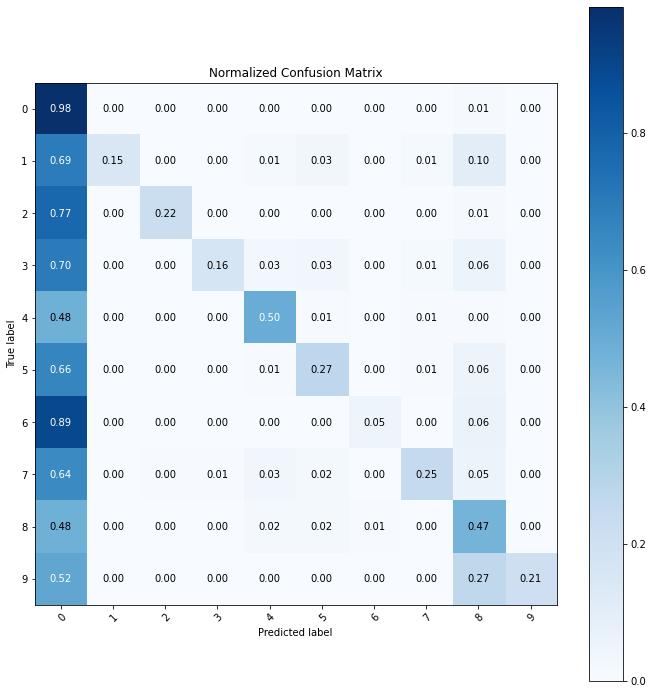

In [ ]:
classes = [0,1,2,3,4,5,6,7,8,9]

%matplotlib inline
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
# We want to show all ticks...
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       # ... and label them with the respective list entries
       xticklabels=list(range(OUTPUT_CHANNELS)), yticklabels=list(range(OUTPUT_CHANNELS)),
       title='Normalized Confusion Matrix',
       ylabel='True label',
       xlabel='Predicted label')

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = '.2f' #'d' # if normalize else 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
fig.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)
ax.set_ylim(len(classes)-0.5, -0.5)

In [ ]:
# compute f1 score
f1_score(flat_truth, flat_preds, average='macro')

0.40018198017143564

In [ ]:
from sklearn.metrics import *
cohen_kappa_score (flat_truth, flat_preds)

0.47232286570572846

In [ ]:
m = tf.keras.metrics.MeanIoU(num_classes=10)
m.update_state(flat_truth, flat_preds)
m.result().numpy()

0.28411284

In [ ]:
a = tf.keras.metrics.Accuracy()
a.update_state(flat_truth, flat_preds)
a.result().numpy()

0.9263303

##ResNet50-UNet

### Define the model

In [ ]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50

def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_resnet50_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained ResNet50 Model """
    resnet50 = ResNet50(include_top=False, weights="imagenet", input_tensor=inputs)
    resnet50.summary()
    """ Encoder """
    s1 = resnet50.get_layer("input_3").output           ## (512 x 512)
    s2 = resnet50.get_layer("conv1_relu").output        ## (256 x 256)
    s3 = resnet50.get_layer("conv2_block3_out").output  ## (128 x 128)
    s4 = resnet50.get_layer("conv3_block4_out").output  ## (64 x 64)

    """ Bridge """
    b1 = resnet50.get_layer("conv4_block6_out").output  ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)

    """ Output """
    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="ResNet50_U-Net")
    return model

In [ ]:
input_shape = (224, 224, 3)
model = build_resnet50_unet(input_shape)
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

### Train the model

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001),
              loss=SparseCategoricalFocalLoss(gamma=2, from_logits=True),
              metrics=['accuracy'])

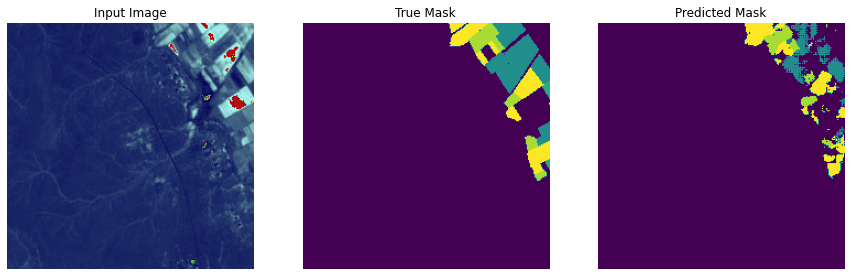


Sample Prediction after epoch 120

604/604 [==============================] - 16s 26ms/step - loss: 0.0078 - accuracy: 0.9924 - val_loss: 0.0935 - val_accuracy: 0.9719


In [ ]:
EPOCHS=120
model_history = model.fit(train_ds, 
                   steps_per_epoch=int(np.ceil(num_train_examples / float(batch_size))),
                   epochs=EPOCHS,
                   validation_data=val_ds,
                   validation_steps=int(np.ceil(num_val_examples / float(batch_size))),
                   callbacks=[DisplayCallback()]) 

### Make predictions

In [ ]:
def get_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      return pred_mask
  else:
    pred_mask = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    pred_mask = tf.keras.backend.eval(pred_mask)
    return pred_mask

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2039.png']
[0 4 5 7 9]


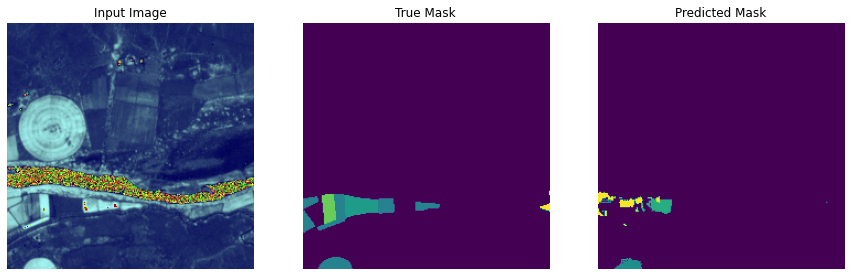

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2040.png']
[0 4]


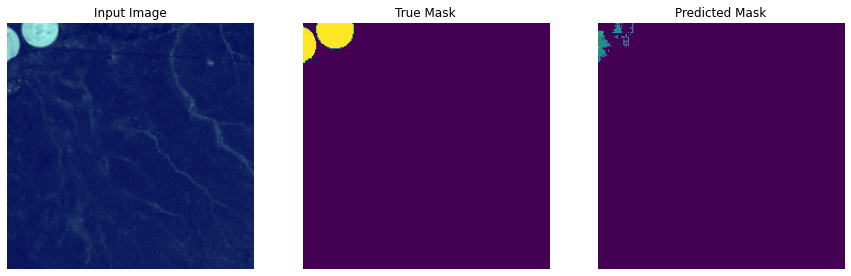

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2089.png']
[0 1 4 6 7 8 9]


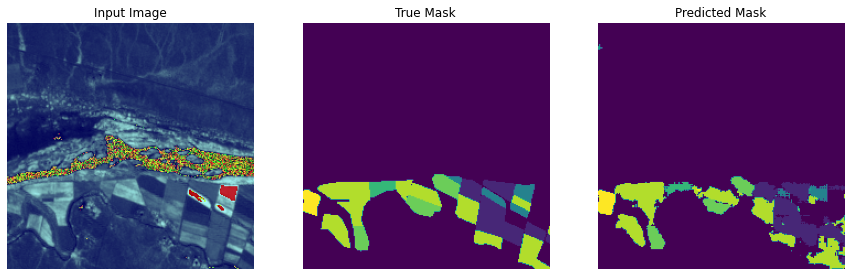

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2090.png']
[0 8]


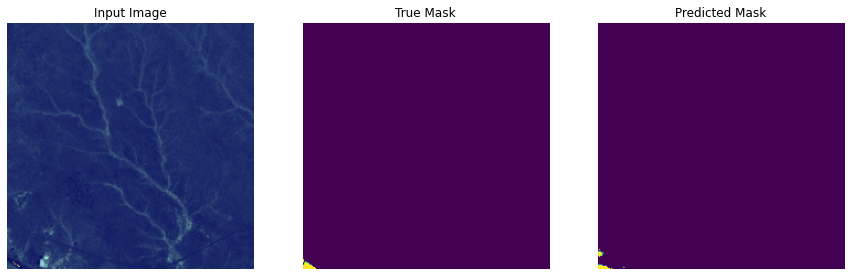

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2139.png']
[0 1 3 4 5 7 8]


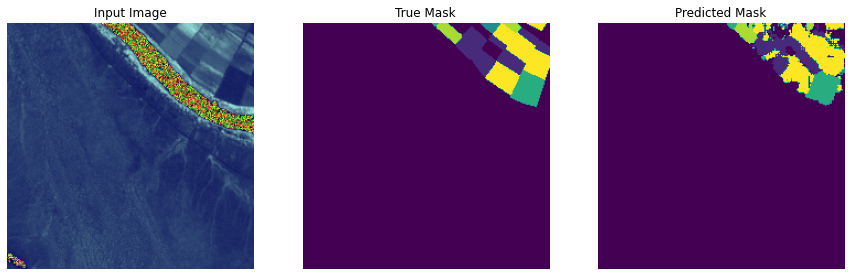

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2140.png']
[0 1 3 4 5 6 7 8]


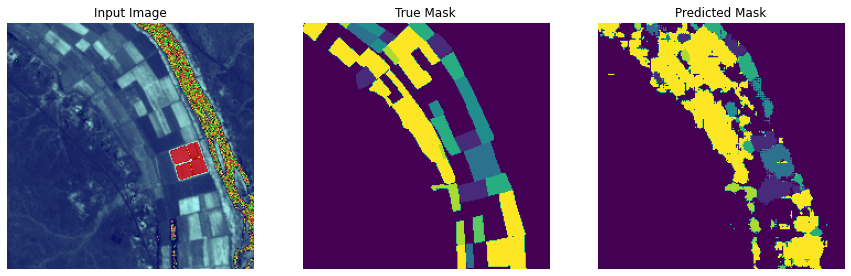

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2141.png']
[0 2 3 4 5 7 8 9]


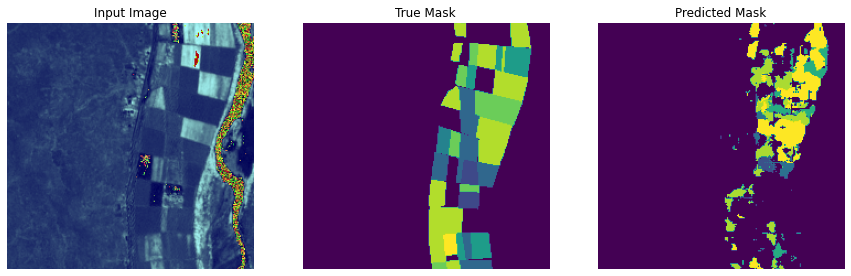

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2142.png']
[0 1 3 4 5 7 8]


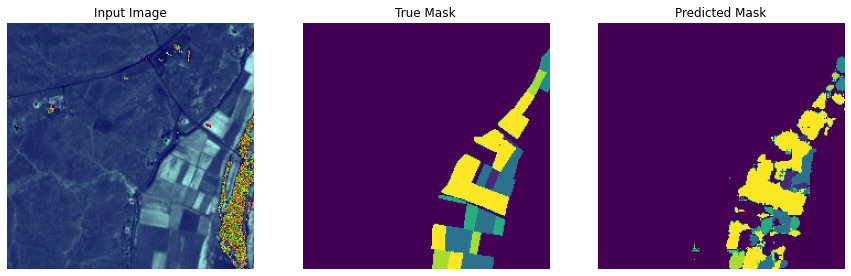

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2192.png']
[0 3 4 6 7 8 9]


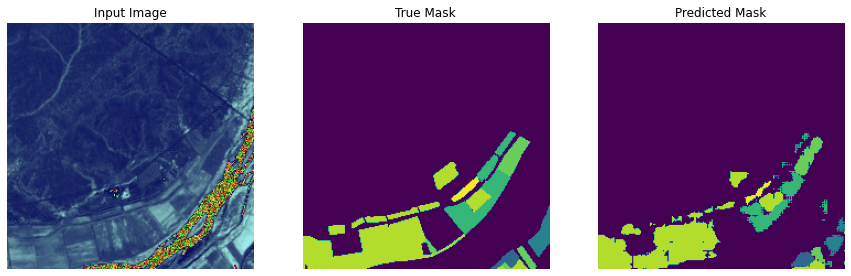

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2193.png']
[0 1 3 4 7 8]


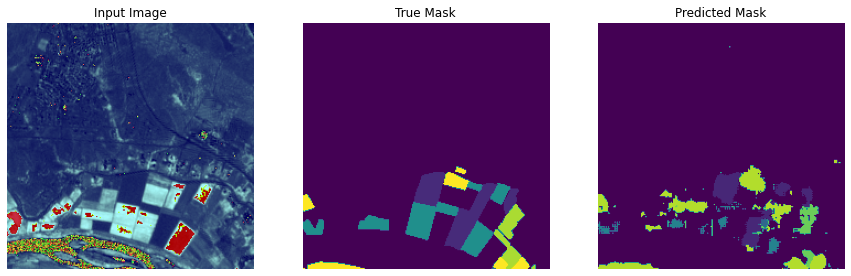

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2241.png']
[0 5 7 8]


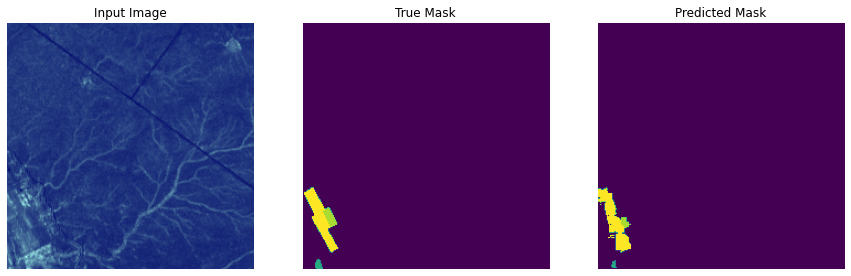

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2242.png']
[0 3 4 5 6 7 8]


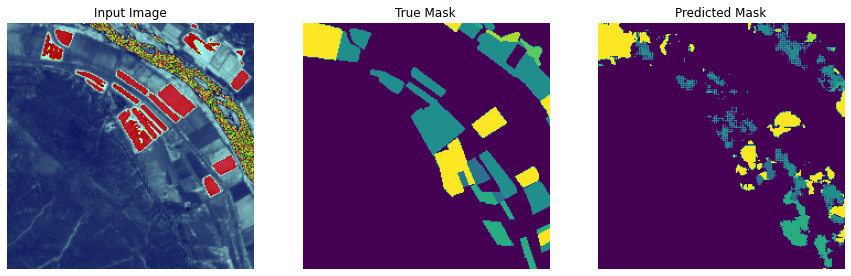

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2243.png']
[0 1 3 4 5 7 8 9]


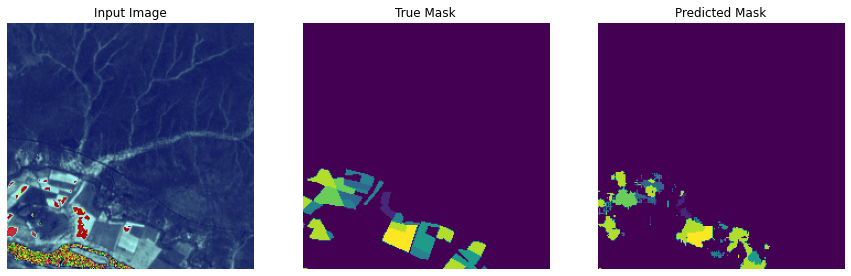

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2290.png']
[0 3 4 5 8]


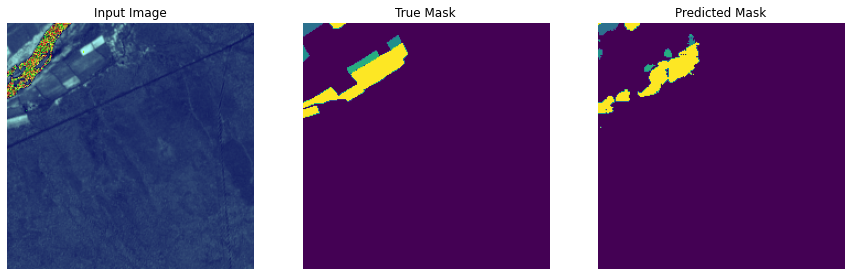

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2291.png']
[0 3 4 5 6 7 8]


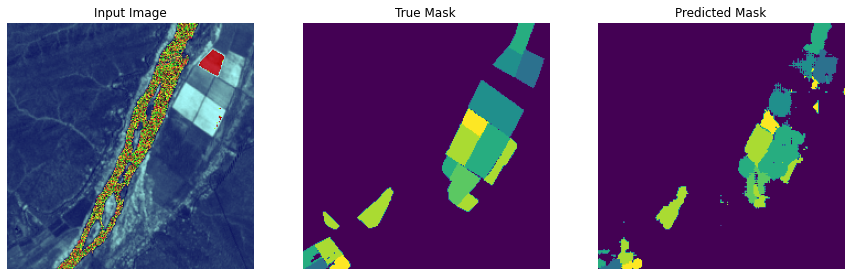

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2292.png']
[0 3 4 5 8]


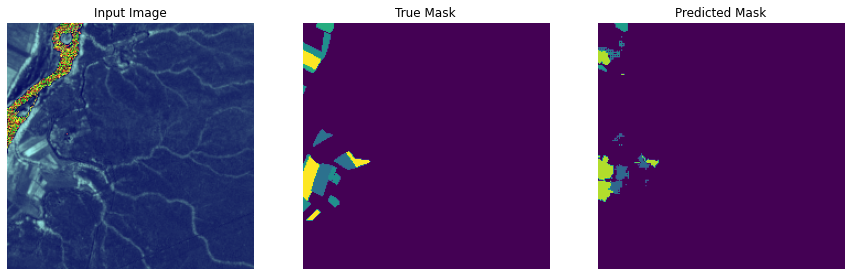

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2342.png']
[0 8]


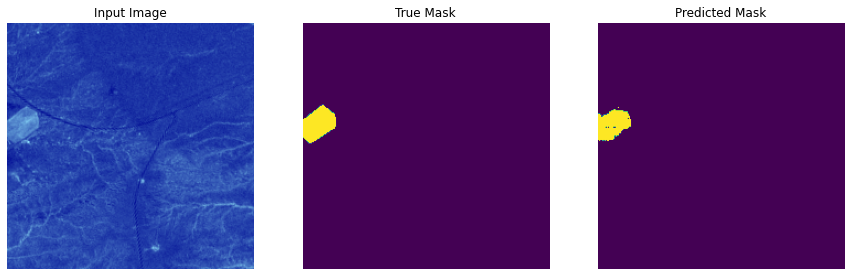

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2341.png']
[0 1 4 5 7]


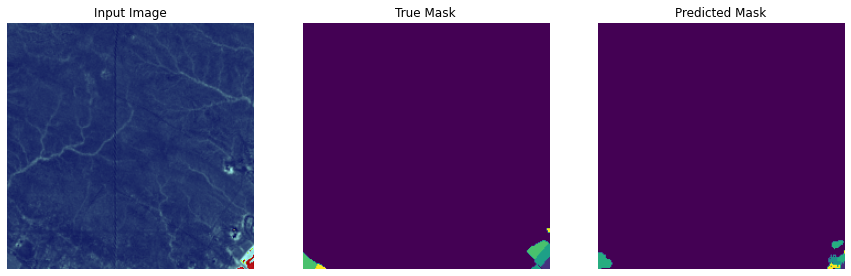

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2340.png']
[0 1 3 4 5 7 8]


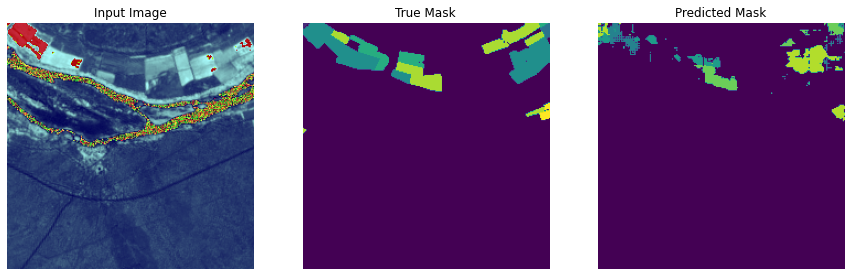

['/content/gdrive/My Drive/data/tiled/labels_test/tile_2017-07-10_2390.png']
[0 1 3 5 7 8]


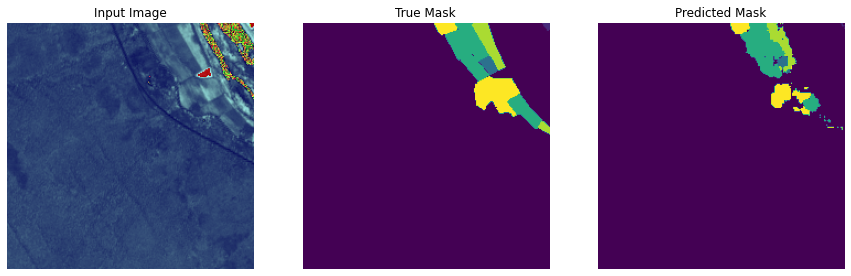

In [ ]:
tiled_prediction_dir = os.path.join(personal_dir,'predictions_test/')
if not os.path.exists(tiled_prediction_dir):
    os.makedirs(tiled_prediction_dir)
    
pred_masks = []
true_masks = []

for i in range(0, 20):
    img_num = i

    temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                                   foreground_list_y[img_num:img_num+1],
                                   preproc_fn=tr_preprocessing_fn,
                                   batch_size=1,
                                   shuffle=False)

    # Let's examine some of these augmented images

    iterator = iter(temp_ds)
    next_element = iterator.get_next()

    batch_of_imgs, label = next_element

    # Running next element in our graph will produce a batch of images

    sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]
    sample_mask_int = tf.dtypes.cast(sample_mask, tf.int32)
    true_masks.append(sample_mask_int)
    print(foreground_list_y[img_num:img_num+1])
    print(np.unique(sample_mask_int))

    # run and plot predicitions

    show_predictions()
    pred_mask = get_predictions()
    pred_masks.append(pred_mask)
    
    # save prediction images to file

    filename_split = os.path.splitext(foreground_list_x[img_num]) 
    filename_zero, fileext = filename_split 
    basename = os.path.basename(filename_zero) 
    tf.keras.preprocessing.image.save_img(tiled_prediction_dir+'/'+basename+".png",pred_mask)    

### Evaluate

In [ ]:
# flatten our tensors and use scikit-learn to create a confusion matrix
flat_preds = tf.reshape(pred_masks, [-1]) 
flat_truth = tf.reshape(true_masks, [-1]) 
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(OUTPUT_CHANNELS)))

In [ ]:
# check values in predicted masks vs truth masks
check_preds = tf.keras.backend.eval(flat_preds)
check_truths = tf.keras.backend.eval(flat_truth)
print(np.unique(check_preds), np.unique(check_truths))

[0 1 2 3 4 5 6 7 8 9] [0 1 2 3 4 5 6 7 8 9]


(9.5, -0.5)

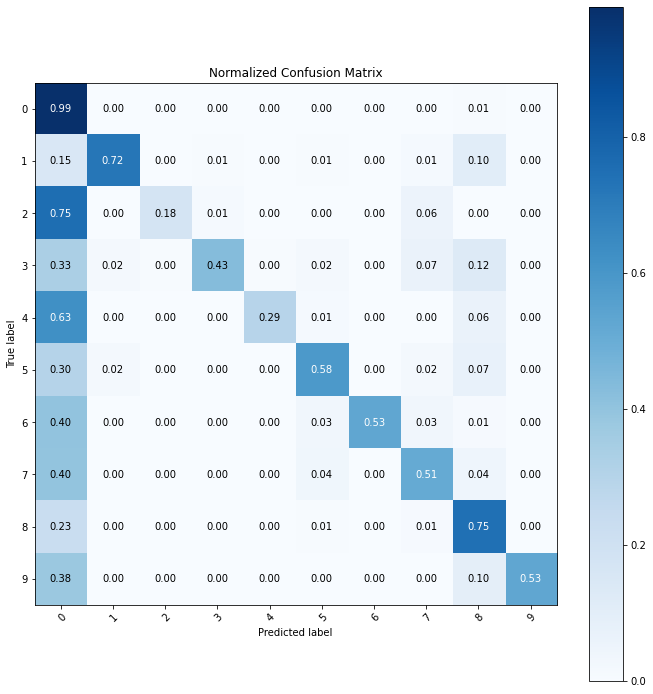

In [ ]:
classes = [0,1,2,3,4,5,6,7,8,9]

%matplotlib inline
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
# We want to show all ticks...
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       # ... and label them with the respective list entries
       xticklabels=list(range(OUTPUT_CHANNELS)), yticklabels=list(range(OUTPUT_CHANNELS)),
       title='Normalized Confusion Matrix',
       ylabel='True label',
       xlabel='Predicted label')

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = '.2f' #'d' # if normalize else 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
fig.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)
ax.set_ylim(len(classes)-0.5, -0.5)

In [ ]:
# compute f1 score
f1_score(flat_truth, flat_preds, average='macro')

0.6384755302780026

In [ ]:
from sklearn.metrics import *
cohen_kappa_score (flat_truth, flat_preds)

0.6866595028464939

In [ ]:
m = tf.keras.metrics.MeanIoU(num_classes=10)
m.update_state(flat_truth, flat_preds)
m.result().numpy()

0.49463806

In [ ]:
a = tf.keras.metrics.Accuracy()
a.update_state(flat_truth, flat_preds)
a.result().numpy()

0.9524474

## MobileNetv2-UNet

### Define the model

In [111]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[224, 224, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False

9420800/9406464 [==============================] - 0s 0us/step


In [114]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [115]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[224,224,3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 224x224

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [116]:
model = unet_model(OUTPUT_CHANNELS)

### Train the model

In [118]:
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001),
              loss=SparseCategoricalFocalLoss(gamma=2, from_logits=True),
              metrics=['accuracy'])

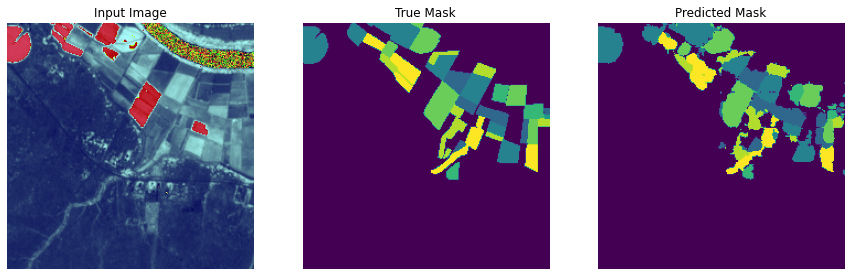


Sample Prediction after epoch 100

604/604 [==============================] - 14s 23ms/step - loss: 0.0063 - accuracy: 0.9935 - val_loss: 0.0665 - val_accuracy: 0.9739


In [119]:
EPOCHS=100
model_history = model.fit(train_ds, 
                   steps_per_epoch=int(np.ceil(num_train_examples / float(batch_size))),
                   epochs=EPOCHS,
                   validation_data=val_ds,
                   validation_steps=int(np.ceil(num_val_examples / float(batch_size))),
                   callbacks=[DisplayCallback()]) 

### Make Predictions

In [120]:
def get_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      return pred_mask
  else:
    pred_mask = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    pred_mask = tf.keras.backend.eval(pred_mask)
    return pred_mask

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-06-20_2089.png']
[0 1 4 6 7 8 9]


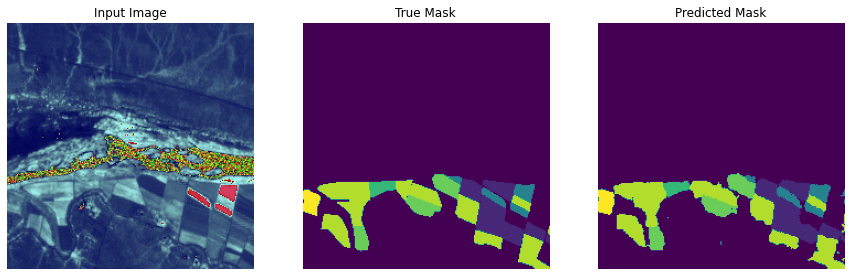

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1269.png']
[0 1 3 4 5 8]


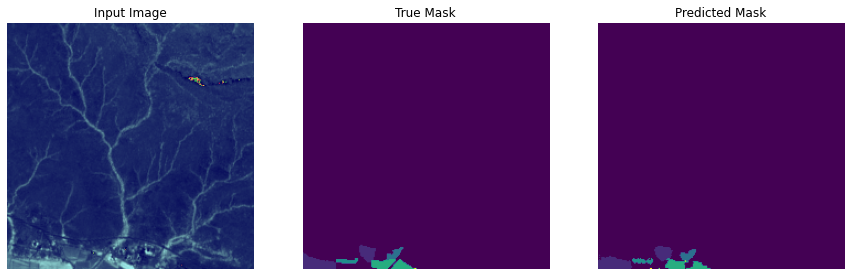

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-06-20_1319.png']
[0 1 4 5 7 8]


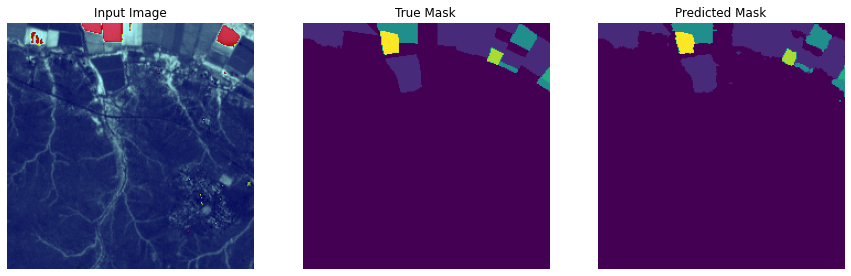

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1886.png']
[0 3 4 5 6 7 8 9]


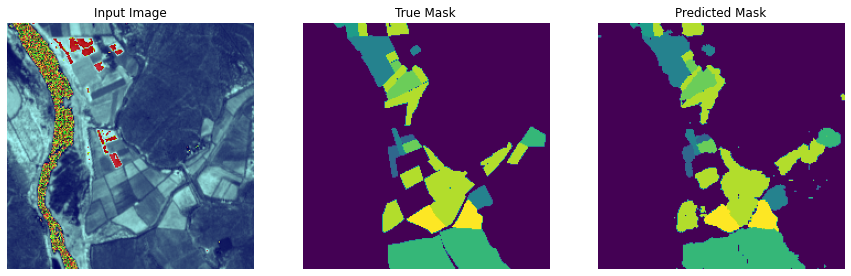

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-03-22_1833.png']
[0 4 5 8 9]


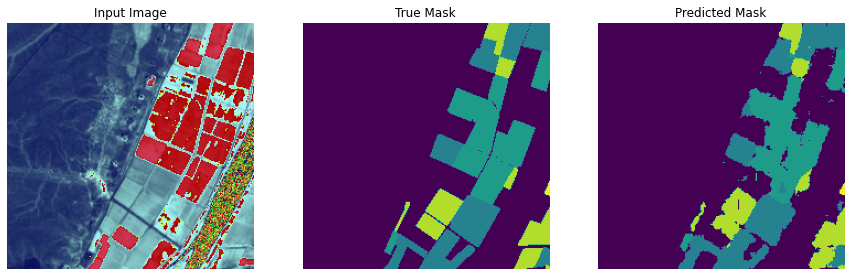

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-08-04_1319.png']
[0 1 4 5 7 8]


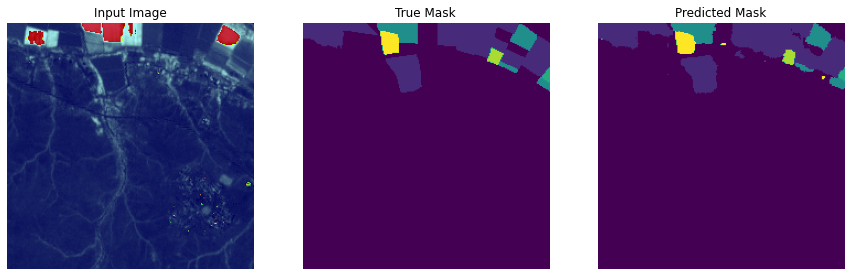

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-03-22_769.png']
[0 8]


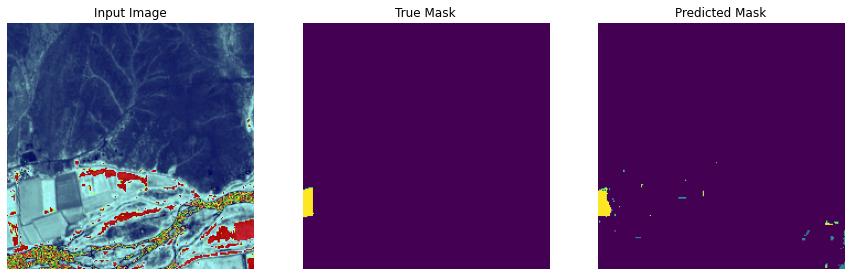

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-08-04_1520.png']
[0 4 5 7 8]


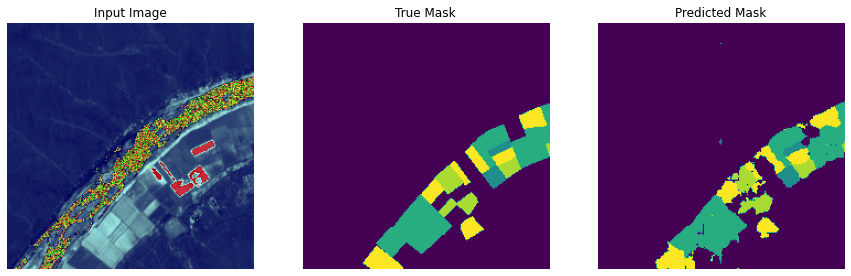

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_2494.png']
[0 1 2 3 4 5 6 7]


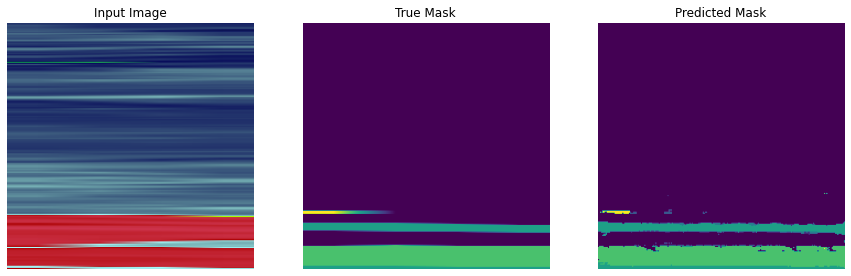

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_2290.png']
[0 3 4 5 8]


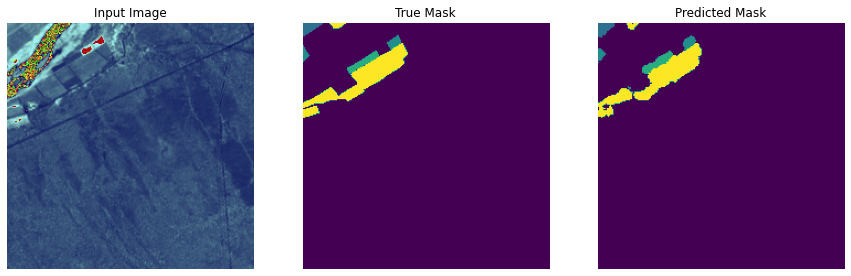

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-08-04_1573.png']
[0 4 5 6 7 8 9]


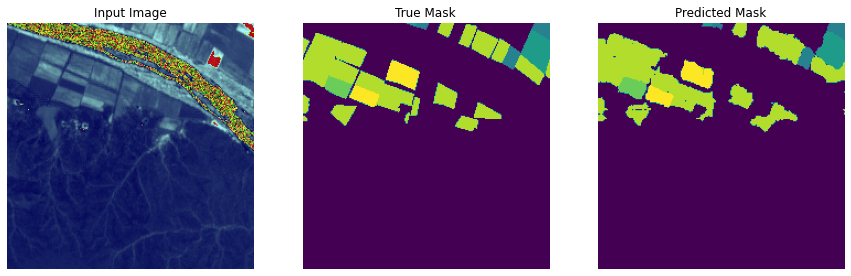

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1989.png']
[0 4 5 7]


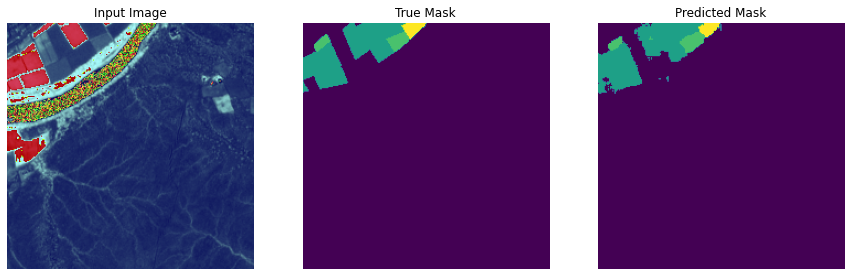

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-06-20_1784.png']
[0 4 8]


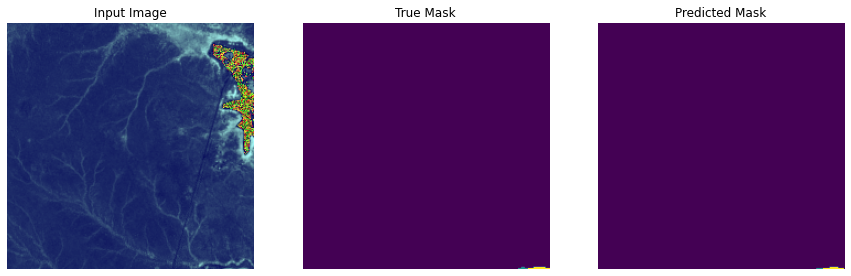

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-06-20_1522.png']
[0 1 4 5 6 7 8]


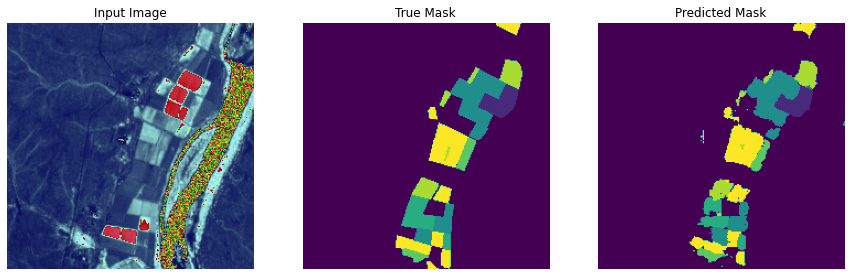

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-08-04_1318.png']
[0 1 4 8]


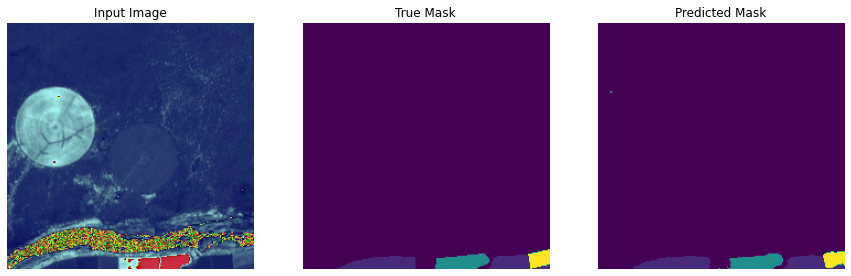

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1017.png']
[0 4]


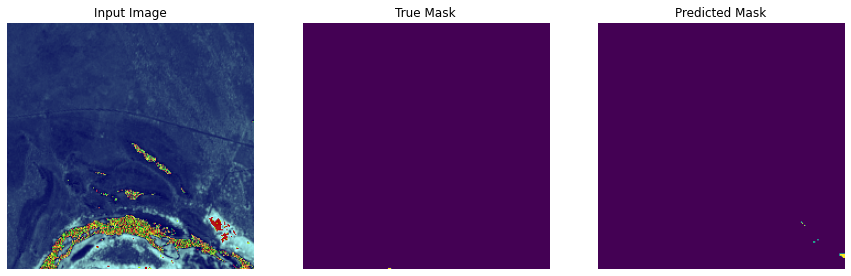

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-03-22_1521.png']
[0 5 8]


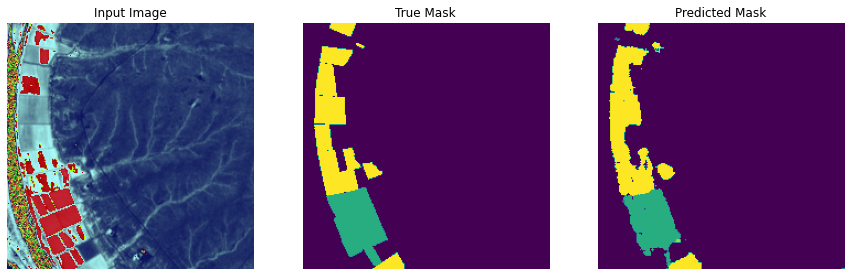

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_2242.png']
[0 3 4 5 6 7 8]


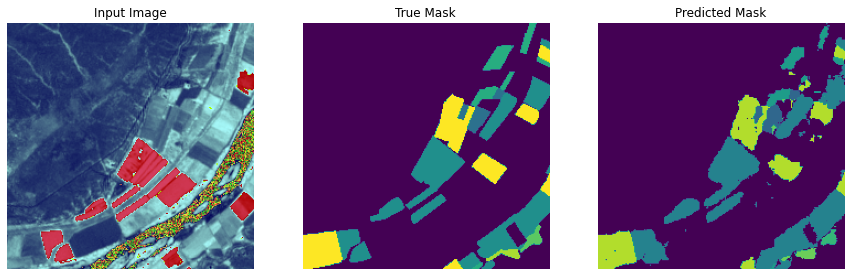

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-03-22_1523.png']
[0 3 4 5 6 7 8]


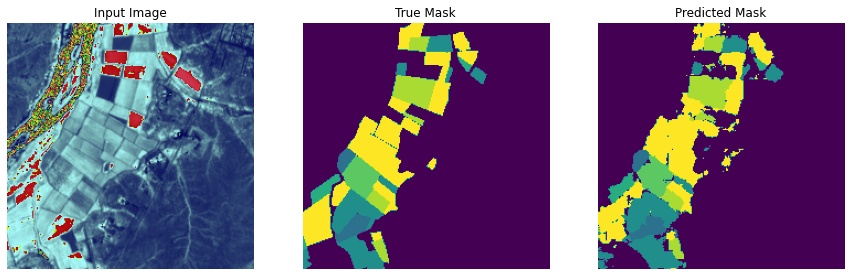

['/content/gdrive/My Drive/data/tiled/labels/tile_2017-05-31_1990.png']
[0 3 4 5 6 7 8 9]


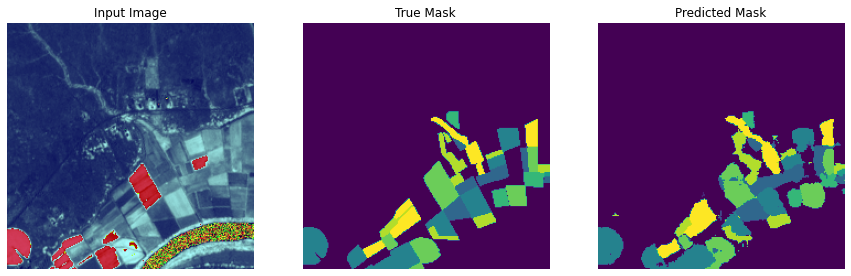

In [121]:
tiled_prediction_dir = os.path.join(personal_dir,'predictions_test/')
if not os.path.exists(tiled_prediction_dir):
    os.makedirs(tiled_prediction_dir)
    
pred_masks = []
true_masks = []

for i in range(0, 20):
    img_num = i

    temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                                   foreground_list_y[img_num:img_num+1],
                                   preproc_fn=tr_preprocessing_fn,
                                   batch_size=1,
                                   shuffle=False)

    # Let's examine some of these augmented images

    iterator = iter(temp_ds)
    next_element = iterator.get_next()

    batch_of_imgs, label = next_element

    # Running next element in our graph will produce a batch of images

    sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]
    sample_mask_int = tf.dtypes.cast(sample_mask, tf.int32)
    true_masks.append(sample_mask_int)
    print(foreground_list_y[img_num:img_num+1])
    print(np.unique(sample_mask_int))

    # run and plot predicitions

    show_predictions()
    pred_mask = get_predictions()
    pred_masks.append(pred_mask)
    
    # save prediction images to file

    filename_split = os.path.splitext(foreground_list_x[img_num]) 
    filename_zero, fileext = filename_split 
    basename = os.path.basename(filename_zero) 
    tf.keras.preprocessing.image.save_img(tiled_prediction_dir+'/'+basename+".png",pred_mask)    

### Evaluate model

In [ ]:
# flatten our tensors and use scikit-learn to create a confusion matrix
flat_preds = tf.reshape(pred_masks, [-1]) 
flat_truth = tf.reshape(true_masks, [-1]) 
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(OUTPUT_CHANNELS)))

In [ ]:
# check values in predicted masks vs truth masks
check_preds = tf.keras.backend.eval(flat_preds)
check_truths = tf.keras.backend.eval(flat_truth)
print(np.unique(check_preds), np.unique(check_truths))

[0 1 2 3 4 5 6 7 8 9] [0 1 2 3 4 5 6 7 8 9]


(9.5, -0.5)

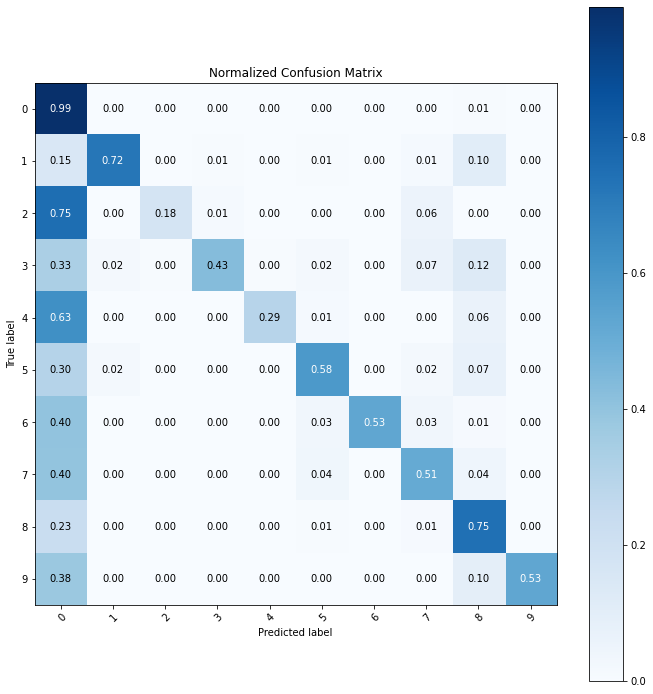

In [ ]:
classes = [0,1,2,3,4,5,6,7,8,9]

%matplotlib inline
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
# We want to show all ticks...
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       # ... and label them with the respective list entries
       xticklabels=list(range(OUTPUT_CHANNELS)), yticklabels=list(range(OUTPUT_CHANNELS)),
       title='Normalized Confusion Matrix',
       ylabel='True label',
       xlabel='Predicted label')

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = '.2f' #'d' # if normalize else 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
fig.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)
ax.set_ylim(len(classes)-0.5, -0.5)

In [ ]:
# compute f1 score
f1_score(flat_truth, flat_preds, average='macro')

0.6384755302780026

In [ ]:
from sklearn.metrics import *
cohen_kappa_score (flat_truth, flat_preds)

0.6866595028464939

In [ ]:
m = tf.keras.metrics.MeanIoU(num_classes=10)
m.update_state(flat_truth, flat_preds)
m.result().numpy()

0.49463806

In [ ]:
a = tf.keras.metrics.Accuracy()
a.update_state(flat_truth, flat_preds)
a.result().numpy()

0.9524474